In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')
#plt.style.use('ggplot')
import scipy as sp
import scipy.stats as stats
%matplotlib inline
import os
from cycler import cycler
#plt.rcParams['figure.legend'] = plt.legend.frame.

In [2]:
#legend customizations
### Legend
#legend.loc           : best
#legend.frameon       : True     # if True, draw the legend on a background patch
#legend.framealpha    : 0.8      # legend patch transparency
#legend.facecolor     : inherit  # inherit from axes.facecolor; or color spec
#legend.edgecolor     : 0.8      # background patch boundary color
#legend.fancybox      : True     # if True, use a rounded box for the
                                 # legend background, else a rectangle
#legend.shadow        : False    # if True, give background a shadow effect
#legend.numpoints     : 1        # the number of marker points in the legend line
#legend.scatterpoints : 1        # number of scatter points
#legend.markerscale   : 1.0      # the relative size of legend markers vs. original
#legend.fontsize      : medium
# Dimensions as fraction of fontsize:
#legend.borderpad     : 0.4      # border whitespace
#legend.labelspacing  : 0.5      # the vertical space between the legend entries
#legend.handlelength  : 2.0      # the length of the legend lines
#legend.handleheight  : 0.7      # the height of the legend handle
#legend.handletextpad : 0.8      # the space between the legend line and legend text
#legend.borderaxespad : 0.5      # the border between the axes and legend edge
#legend.columnspacing : 2.0      # column separation

plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.facecolor'] = 'white'
plt.rcParams['legend.edgecolor'] = 'black' 

# Attempt to make the figure size better for our title
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['savefig.pad_inches'] = 0.2 #double default value

In [3]:
file_list = ['1_First Solar Module_Results complete.xlsx', '2_Solar World Module_Results complete.xlsx', '3_Wurth_Module_Results_complete.xlsx', '4_Sharp Module_Results complete.xlsx']

irr_arr=[]
panel_arr=[]
G_500 = 0
G_750 = 1
G_1000 = 2
First = 0
SolarWorld = 1
Wurth = 2 
Sharp = 3
panel_names_arr = ['First', 'SolarWorld', 'Wuerth', 'Sharp']
irr_names_arr = ['G=500', 'G=750', 'G=1000']

for index,excels in enumerate(file_list) : 
    xls = pd.ExcelFile(excels)
    print(xls.sheet_names)
    irr_arr = []  # clear
    irr_arr.append((xls.parse('G=500')).reset_index())
    irr_arr.append((xls.parse('G=750')).reset_index())
    irr_arr.append((xls.parse('G=1000')).reset_index())
    panel_arr.append(irr_arr)



    

['G=500', 'G=750', 'G=1000', 'Sheet1', 'G1000 results']
['G=500', 'G=750', 'G=1000', 'Sheet1', 'Sheet2']
['G=500', 'G=500 analysis', 'G=750', 'G=750 analysis', 'G=1000', 'G1000 6 months', 'G1000 results', 'G=750 results', 'G=500 results', 'Mod Temp data', 'Sheet1']
['G=500', 'G=750', 'G=1000', 'G750 ', 'G500', 'G500 analysis', 'Summary data', 'G750 analysis', 'G1000 analysis', 'G1000 6 month']


In [4]:
def get_outliers(col, num_iqr=12, high_low='both'):
    #plt.boxplot(col)
    #plt.show()
    Q1 = col.quantile(0.25)
    Q3 = col.quantile(0.75)
    IQR = Q3 - Q1
    #print(IQR)
    #print("{} = {}-{}".format(IQR, Q3, Q1))
    low_limit = Q1 - num_iqr*IQR
    high_limit = Q3 + num_iqr*IQR
    if high_low == 'low':
        return (col < low_limit)
    elif (high_low == 'high'):
        return (col > high_limit)
    elif (high_low == 'both'):
        return (col > high_limit) | ( col < low_limit)
    else:
        print('non-valid input for high_low, try again.')
        return #null
        

In [5]:
def get_iv_vals(df):
    voltage = []
    current = []
    for sample,iv in enumerate(df['IV data']):
        #print(sample,type(iv),len(iv),iv[0])
        voltage_i = []
        current_i = []
        #print(iv[0:8])
        for iv_i in (iv[i:i+8] for i in range(0, len(iv), 8)):
            #print(iv_i[0:4],'&',iv_i[4:8])
            voltage_i.append(int((iv_i[2:4]+iv_i[0:2]),16)/100) # reorder and string concat
            current_i.append(int((iv_i[6:8]+iv_i[4:6]),16)/1000)
        voltage.append(voltage_i)
        current.append(current_i)
        #print("v is", voltage, "; i is", current)
    return voltage, current


In [6]:
def get_avg(df_col,rows_compare=30,start_at_end=False):
    # We only care about the first 30 rows and last 30 rows to compare degredation
    #rows_compare = 30 # This actually doesn't turn out to be the days right now, because we sometimes have 2 data collections per day.
    num_samps = len(df_col[0])
    acc = np.empty
    acc = np.zeros(num_samps)
    
    #print(len(voltage_acc))
    #print(range(num_samps if start_at_end else 0, num_samps-rows_compare if start_at_end else rows_compare, -1 if start_at_end else 1))
    for i in range(num_samps if start_at_end else 0, num_samps-rows_compare if start_at_end else rows_compare, -1 if start_at_end else 1):
        # Technically probably way more efficient to divide the incoming sample by days_compare (essentially doing the average step in advance)
        # Althoug maybe not, because division is more taxing than adding. This method only uses only divison.
        acc = list(map(sum, zip(*(df_col[i],acc)))) 
    
    avg = [samp / rows_compare for samp in acc]
    
    #print(voltage_avg)
    return avg

In [7]:
def plot_ci_manual(t, s_err, n, x, x2, y2, ax=None):
    """Return an axes of confidence bands using a simple approach.

    Notes
    -----
    .. math:: \left| \: \hat{\mu}_{y|x0} - \mu_{y|x0} \: \right| \; \leq \; T_{n-2}^{.975} \; \hat{\sigma} \; \sqrt{\frac{1}{n}+\frac{(x_0-\bar{x})^2}{\sum_{i=1}^n{(x_i-\bar{x})^2}}}
    .. math:: \hat{\sigma} = \sqrt{\sum_{i=1}^n{\frac{(y_i-\hat{y})^2}{n-2}}}

    References
    ----------
    .. [1]: M. Duarte.  "Curve fitting," JUpyter Notebook.
       http://nbviewer.ipython.org/github/demotu/BMC/blob/master/notebooks/CurveFitting.ipynb

    """
    if ax is None:
        ax = plt.gca()

    ci = t*s_err*np.sqrt(1/n + (x2-np.mean(x))**2/np.sum((x-np.mean(x))**2))
    ax.fill_between(x2, y2+ci, y2-ci, color="Green", alpha=0.3, edgecolor="")

    return ax


def plot_ci_bootstrap(xs, ys, resid, nboot=500, ax=None):
    """Return an axes of confidence bands using a bootstrap approach.

    Notes
    -----
    The bootstrap approach iteratively resampling residuals.
    It plots `nboot` number of straight lines and outlines the shape of a band.
    The density of overlapping lines indicates improved confidence.

    Returns
    -------
    ax : axes
        - Cluster of lines
        - Upper and Lower bounds (high and low) (optional)  Note: sensitive to outliers

    References
    ----------
    .. [1] J. Stults. "Visualizing Confidence Intervals", Various Consequences.
       http://www.variousconsequences.com/2010/02/visualizing-confidence-intervals.html

    """ 
    if ax is None:
        ax = plt.gca()

    bootindex = sp.random.randint

    for _ in range(nboot):
        resamp_resid = resid[bootindex(0, len(resid)-1, len(resid))]
        # Make coeffs of for polys
        pc = sp.polyfit(xs, ys + resamp_resid, 1)                   
        # Plot bootstrap cluster
        ax.plot(xs, sp.polyval(pc, xs), "b-", linewidth=2, alpha=3.0/float(nboot))

    return ax

In [8]:
def scatter_label(df,x_param,y_param,x_units='', y_units='',get_x_lim=False,get_y_lim=False):
    plt.scatter(df[[x_param]],df[[y_param]], alpha=0.2)
    
    if get_y_lim:
        plt.ylim(-1*(df[[y_param]].quantile([0.75]).values),1.4*(df[[y_param]].max().values),auto=False)
    if get_x_lim:
        plt.xlim(-1*(df[[x_param]].quantile([0.75]).values),1.4*(df[[x_param]].max().values),auto=False)
    
    if x_units:
        plt.xlabel('{} ({})'.format(x_param,x_units))
    else:
        plt.xlabel('{}'.format(x_param))
    
    if y_units:
        plt.ylabel('{} ({})'.format(y_param,y_units))
    else:
        plt.ylabel('{}'.format(y_param))
    return #null

def plot_corr(df, df_name,x_param,y_param,x_units='', y_units='', need_lim=False):
    #for simplicity
    x = df[x_param]
    y = df[y_param]
    p, cov = np.polyfit(x, y, 1, cov=True) 
    print("p is {}".format(p))
    print("cov is {}".format(cov))
    
    #my_cov # sum(xi-xmean * yi-ymean)/n
    #print(x.mean(),y.mean())
    #print(x.std(),y.std())
    #print(x.mean(),y.mean())
    x_mean = x.mean()
    y_mean = y.mean()
    xi_std_up, xi_std_low, yi_std_up, yi_std_low =[],[],[],[]
    xy_sum = 0
    for xi,yi in zip(x,y):
        #print("xi-mean is {} ; yi-mean is {}".format(xi-x_mean,yi-y_mean))
        xy_sum += (xi-x_mean)*(yi-y_mean)
        xi_std_up.append(xi + x.std()) 
        xi_std_low.append(xi - x.std())
        
        yi_std_up.append(yi + y.std())
        yi_std_low.append(yi - y.std())
        #print("sum is {}".format(xy_sum))
    my_cov = xy_sum/len(x)
    my_corr = my_cov/(x.std()*y.std())
    print("Final covariance is {}. Then correlation is {}".format(my_cov, my_corr))
    
    #y_linear = np.polyval(p, x)
    #print("y_linear is {}".format(y_linear))
    #plt.plot(x,y_linear, 'g--', alpha=0.5)
    #print(y.quantile(0.975))    
    
    #x = heights
    #y = weights
    
    # Modeling with Numpy
    def equation(a, b):
        """Return a 1D polynomial."""
        return np.polyval(a, b) 
    
    p, cov = np.polyfit(x, y, 1, cov=True)                     # parameters and covariance from of the fit of 1-D polynom.
    y_model = equation(p, x)                                   # model using the fit parameters; NOTE: parameters here are coefficients
    
     
    # Statistics
    n = x.size                                           # number of observations
    m = p.size                                                 # number of parameters
    dof = n - m                                                # degrees of freedom
    t = stats.t.ppf(0.975, dof)                                # used for CI and PI bands ; Percent point function (inverse of cdf — percentiles).
    
    # Estimates of Error in Data/Model
    resid = y - y_model                           
    chi2 = np.sum((resid/y_model)**2)                          # chi-squared; estimates error in data
                                                               # https://en.wikipedia.org/wiki/Chi-squared_distribution
    chi2_red = chi2/(dof)                                      # reduced chi-squared; measures goodness of fit
    s_err = np.sqrt(np.sum(resid**2)/(dof))                    # standard deviation of the error
    
    
    # Plotting --------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Data
    #ax.scatter(
    #    x, y, alpha=0.4
    #)
    scatter_label(df,y_param=y_param,x_param=x_param,x_units=x_units, y_units=y_units,get_x_lim=need_lim)

    # Fit
    ax.plot(x,y_model,"-", color="0.1", linewidth=1.5, alpha=0.5, label="Fit , r = %+.4f"%(my_corr))  
    
    x2 = np.linspace(np.min(x), np.max(x), 100)
    y2 = equation(p, x2)
    
    # Confidence Interval (select one)
    plot_ci_manual(t, s_err, n, x, x2, y2, ax=ax)
    #plot_ci_bootstrap(x, y, resid, ax=ax)
    
    # Prediction Interval
    pi = t*s_err*np.sqrt(1+1/n+(x2-np.mean(x))**2/np.sum((x-np.mean(x))**2))   
    ax.fill_between(x2, y2+pi, y2-pi, color="None", linestyle="--")
    ax.plot(x2, y2-pi, "--", color="0.5", label="95% Prediction Limits")
    ax.plot(x2, y2+pi, "--", color="0.5")
    
    # Figure Modifications --------------------------------------------------------
    # Borders
    #ax.spines["top"].set_color("0.5")
    #ax.spines["bottom"].set_color("0.5")
    #ax.spines["left"].set_color("0.5")
    #ax.spines["right"].set_color("0.5")
    #ax.get_xaxis().set_tick_params(direction="out")
    #ax.get_yaxis().set_tick_params(direction="out")
    #ax.xaxis.tick_bottom()
    #ax.yaxis.tick_left() 
    
    # Labels
    #plt.title("Fit Plot for Weight", fontsize="14", fontweight="bold")
    #plt.xlabel("Height")
    #plt.ylabel("Weight")
    plt.xlim(np.min(x)*0.95,np.max(x)*1.05)
    
    # Custom legend
    handles, labels = ax.get_legend_handles_labels()
    display = (0, 1)
    anyArtist = plt.Line2D((0,1), (0,0), color="Green")      # create custom artists
    legend = plt.legend(
        [handle for i, handle in enumerate(handles) if i in display] + [anyArtist],
        [label for i, label in enumerate(labels) if i in display] + ["95% Confidence Limits"],
        loc=9, bbox_to_anchor=(0, -0.21, 1., .102), ncol=3, mode="expand"
    )  
    frame = legend.get_frame().set_edgecolor("0.5")
    
    # Save Figure
    plt.tight_layout()
    #plt.savefig("filename.png", bbox_extra_artists=(legend,), bbox_inches="tight")
    #df_arr_name = "G500"
    plt.title("{y_param} vs {x_param} for {df_name}".format(x_param=x_param, y_param=y_param, df_name=df_name))
    plt.savefig('correlation_{y_param}_vs_{x_param}_{df_name}.svg'.format(x_param=x_param, y_param=y_param, df_name=df_name))
    plt.show()

In [9]:
#super annoying (but nessecary) pre-processing steps

# PUT COLUMN NAMES YOU WISH TO FILTER HERE


for panel_i, panel in enumerate(panel_arr):
    # Drop outliers Columns
    drop_cols = ['Rs'
                 ,'Rsh'
                 ,panel_names_arr[panel_i]+'FF'
                 ,panel_names_arr[panel_i]+'PMPP'
                 ,panel_names_arr[panel_i]+'Eta'
                ]
    # Drop any negative values for the given columns
    noneg_cols= ['Rs'
                 ,'Rsh'
                 , panel_names_arr[panel_i]+'FF'
                 , panel_names_arr[panel_i]+'Eta'
                ]
    # No NA values (should only be applicable for IV DATA)
    no_na_cols = ['IV data'
                 ,panel_names_arr[panel_i]+'TMod'
                 ,panel_names_arr[panel_i]+'PMPP'
                 ,'Rs'] 
    for irr_i, irr in enumerate(panel):
        #Wurth & First have wrong col name
        panel_arr[panel_i][irr_i].rename(columns={'IV Curve ':'IV data'}, inplace=True)
        panel_arr[panel_i][irr_i].rename(columns={'IV Data':'IV data'}, inplace=True)
        
        
        #Solar G500 has NA values that screw up calculations
        for no_na_col in no_na_cols:
            panel_arr[panel_i][irr_i].dropna(inplace=True,subset=[no_na_col])
        #Get rid of obvious outliers (Q - 12*IQR)
        for drop_col in drop_cols:
            print('BeforeDropOutlier: \t{} \t({} at {}):\tmin:{}\tmax:{}'.format(drop_col,panel_names_arr[panel_i],irr_names_arr[irr_i],panel_arr[panel_i][irr_i][drop_col].min(),panel_arr[panel_i][irr_i][drop_col].max()))
            panel_arr[panel_i][irr_i].drop(inplace=True, 
                                       index=panel_arr[panel_i][irr_i][get_outliers(panel_arr[panel_i][irr_i][drop_col],high_low='both')].index
                                      )
            print('AfterDropOutlier: \t{} \t({} at {}):\tmin:{}\tmax:{}'.format(drop_col,panel_names_arr[panel_i],irr_names_arr[irr_i],panel_arr[panel_i][irr_i][drop_col].min(),panel_arr[panel_i][irr_i][drop_col].max()))
        #Some cols/characteristic can't be negative, so obviously wrong
        for noneg_col in noneg_cols:
            if ((panel_arr[panel_i][irr_i][noneg_col]<0).any()):
                print('BeforeDropNeg: \t{} \t({} at {}):\tmin:{}\tmax:{}'.format(noneg_col,panel_names_arr[panel_i],irr_names_arr[irr_i],panel_arr[panel_i][irr_i][noneg_col].min(),panel_arr[panel_i][irr_i][noneg_col].max()))
                panel_arr[panel_i][irr_i].drop(inplace=True, 
                                       index=panel_arr[panel_i][irr_i][panel_arr[panel_i][irr_i][noneg_col]<0].index
                                      )
                print('AfterDropNeg: \t{} \t({} at {}):\tmin:{}\tmax:{}'.format(noneg_col, panel_names_arr[panel_i],irr_names_arr[irr_i],panel_arr[panel_i][irr_i][noneg_col].min(),panel_arr[panel_i][irr_i][noneg_col].max()))
            else:
                print("NO NEGATIVE VALUES FOUND FOR {} \t({} at {})".format(noneg_col, panel_names_arr[panel_i],irr_names_arr[irr_i]))
        # For some inexplicable reason, Year column values were floats...
        panel_arr[panel_i][irr_i]['Year'] = panel_arr[panel_i][irr_i]['Year'].round().astype(int)
        panel_arr[panel_i][irr_i]['Month'] = panel_arr[panel_i][irr_i]['Month'].round().astype(int)
        
        
        #After all this filtering, reset the index
        panel_arr[panel_i][irr_i].reset_index(drop=True, inplace=True)


BeforeDropOutlier: 	Rs 	(First at G=500):	min:-1381.44089749817	max:41.2351084413467
AfterDropOutlier: 	Rs 	(First at G=500):	min:6.0801989073992	max:24.850688103202
BeforeDropOutlier: 	Rsh 	(First at G=500):	min:903.050923286977	max:5293.20666429566
AfterDropOutlier: 	Rsh 	(First at G=500):	min:903.050923286977	max:5293.20666429566
BeforeDropOutlier: 	FirstFF 	(First at G=500):	min:0.588732	max:0.687283
AfterDropOutlier: 	FirstFF 	(First at G=500):	min:0.588732	max:0.687283
BeforeDropOutlier: 	FirstPMPP 	(First at G=500):	min:10.6997	max:70249.4
AfterDropOutlier: 	FirstPMPP 	(First at G=500):	min:10.6997	max:85.4015
BeforeDropOutlier: 	FirstEta 	(First at G=500):	min:0.0	max:0.410743
AfterDropOutlier: 	FirstEta 	(First at G=500):	min:0.0312908	max:0.177009
NO NEGATIVE VALUES FOUND FOR Rs 	(First at G=500)
NO NEGATIVE VALUES FOUND FOR Rsh 	(First at G=500)
NO NEGATIVE VALUES FOUND FOR FirstFF 	(First at G=500)
NO NEGATIVE VALUES FOUND FOR FirstEta 	(First at G=500)
BeforeDropOutlier: 	

In [10]:

for panel_i, panel in enumerate(panel_arr) :
    for irr_i, irr in enumerate(panel) :
        print(len(irr['IV data']))
        print(panel_names_arr[panel_i], irr_names_arr[irr_i])
        voltage_temp, current_temp = get_iv_vals(irr.reset_index(drop=True))
        panel_arr[panel_i][irr_i]['Voltage'] = voltage_temp
        panel_arr[panel_i][irr_i]['Current'] = current_temp

768
First G=500
620
First G=750
876
First G=1000
502
SolarWorld G=500
615
SolarWorld G=750
851
SolarWorld G=1000
626
Wuerth G=500
744
Wuerth G=750
943
Wuerth G=1000
773
Sharp G=500
719
Sharp G=750
936
Sharp G=1000


In [11]:
def count(l):
    return sum(1+count(i) for i in l if isinstance(i,list))

panel_voltage_avg_start_arr = []
panel_current_avg_start_arr = []
panel_voltage_avg_end_arr   = []
panel_current_avg_end_arr   = []
#turns out we had removed indexes which are causing mayhem
# reset them and dump the previous index values
#TODO: fix this code to not be sha
#for start_finsh in [initial,last]: 
for panel_i, panel in enumerate(panel_arr) :
    filtered_df_arr_first = []
    filtered_df_arr_last =  []
    voltage_avg_start_arr = []
    voltage_avg_end_arr =   []
    current_avg_start_arr = []
    current_avg_end_arr =   []
    for irr_i, irr in enumerate(panel) :   
        filtered_df_arr_first.append(irr[(irr['Year'] == 2009) & (irr['Month'] == 9)])
        filtered_df_arr_last.append(irr[(irr['Year'] == 2010) & (irr['Month'] == 9)])
        filtered_df_arr_first[irr_i].reset_index(drop=True, inplace=True)
        filtered_df_arr_last[irr_i].reset_index(drop=True, inplace=True)
        #print(filtered_df_arr_first[g]['Voltage'][0])
        voltage_avg_start_arr.append(get_avg(filtered_df_arr_first[irr_i]['Voltage'], rows_compare=len(filtered_df_arr_first[irr_i]['Voltage'])))    
        current_avg_start_arr.append(get_avg(filtered_df_arr_first[irr_i]['Current'], rows_compare=len(filtered_df_arr_first[irr_i]['Current'])))
        voltage_avg_end_arr.append(get_avg(filtered_df_arr_last[irr_i]['Voltage'], rows_compare=len(filtered_df_arr_last[irr_i]['Voltage'])))
        current_avg_end_arr.append(get_avg(filtered_df_arr_last[irr_i]['Current'], rows_compare=len(filtered_df_arr_last[irr_i]['Current'])))

    panel_voltage_avg_start_arr.append(voltage_avg_start_arr)
    panel_current_avg_start_arr.append(current_avg_start_arr)
    panel_voltage_avg_end_arr.append(voltage_avg_end_arr)
    panel_current_avg_end_arr.append(current_avg_end_arr)
    #print(count(panel_voltage_start_avg_arr))

print('{}  {}  {}'.format(len(panel_voltage_avg_start_arr),len(panel_voltage_avg_start_arr[0]),len(panel_voltage_avg_start_arr[0][0])))
#for panel_i, panel in enumerate(panel_arr) :
#    for irr_i, irr in enumerate(panel) : 
#        print('{}  {}  {}'.format(len(panel_voltage_avg_start_arr),len(panel_voltage_avg_start_arr[panel_i]),len(panel_voltage_avg_start_arr[panel_i][irr_i])))
        #print(voltage_avg_end_arr[irr_i])
        #print(current_avg_end_arr[irr_i])

4  3  256


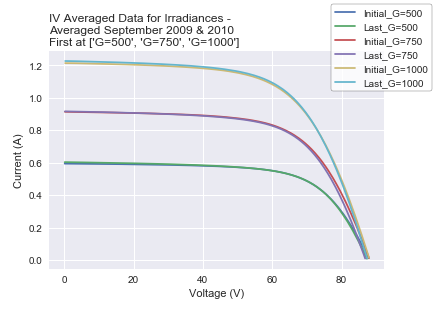

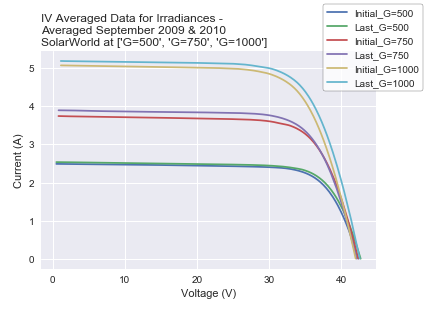

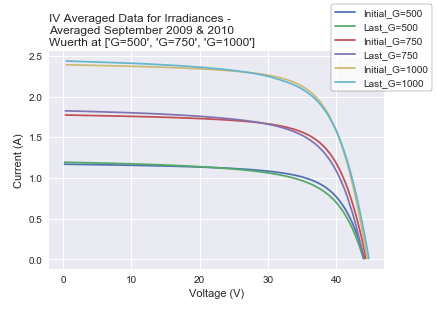

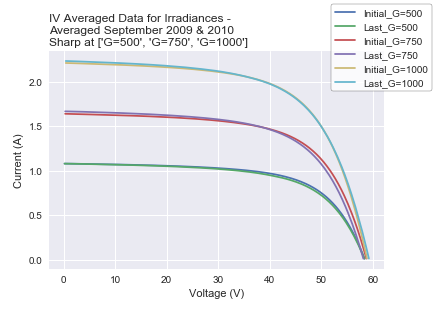

In [12]:
for panel_i, panel in enumerate(panel_arr) :
    for irr_i, irr in enumerate(panel) : 
        plt.plot(panel_voltage_avg_start_arr[panel_i][irr_i],panel_current_avg_start_arr[panel_i][irr_i],'-', label='Initial_'+irr_names_arr[irr_i])
        plt.plot(panel_voltage_avg_end_arr[panel_i][irr_i],panel_current_avg_end_arr[panel_i][irr_i], '-', label='Last_'+irr_names_arr[irr_i])
    plt.title('IV Averaged Data for Irradiances - \nAveraged September 2009 & 2010\n{panel} at {irr}'.format(panel=panel_names_arr[panel_i], irr=irr_names_arr),loc='left')
    plt.ylabel('Current (A)')
    plt.xlabel('Voltage (V)')
    #Change with this for position
    #We've already got figlengend entries from the plots
    #plt.figlegend(loc="best")
    plt.figlegend()
    plt.savefig('IV_AVG_inital_last_for_{}_at_all_irr.svg'.format(panel_names_arr[panel_i]))
    plt.show()

    
                    

#plt.figlegend((df_arr_names))
#        plt.savefig('{temp}_vs_{elec_char}_all_irr.svg'.format(elec_char=elec_char, temp=temp))
#        plt.show()
#        
#        
#plt.figlegend(('IVavg_InitialG500','IVavg_LastG500','IVavg_InitialG750','IVavg_LastG750','IVavg_InitialG1000','IVavg_LastG1000'))
#plt.ylabel('Current (A)')
#plt.xlabel('Voltage (V)')
#plt.title('IV data for Irradiances - \nAveraged First & Last 30 Days',loc='left')
#plt.savefig('IV_firstAVG_lastAVG_results_at_G500_750_1000_onegraph.svg')
#plt.show()

['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 0, inital_colour is #4C72B0, last_colour is #55A868
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 1, inital_colour is #C44E52, last_colour is #8172B2
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 2, inital_colour is #CCB974, last_colour is #64B5CD
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])


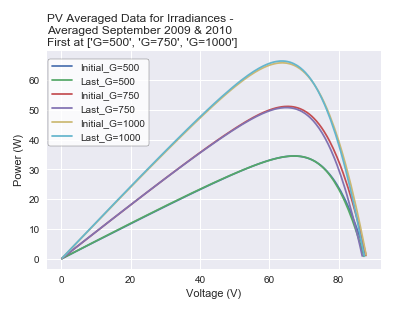

['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 0, inital_colour is #4C72B0, last_colour is #55A868
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 1, inital_colour is #C44E52, last_colour is #8172B2
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 2, inital_colour is #CCB974, last_colour is #64B5CD
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])


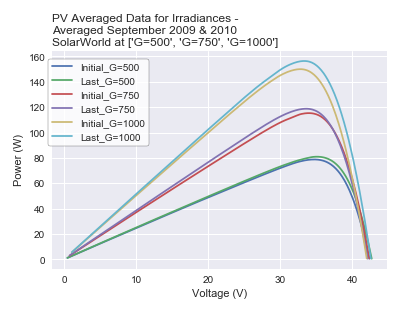

['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 0, inital_colour is #4C72B0, last_colour is #55A868
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 1, inital_colour is #C44E52, last_colour is #8172B2
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 2, inital_colour is #CCB974, last_colour is #64B5CD
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])


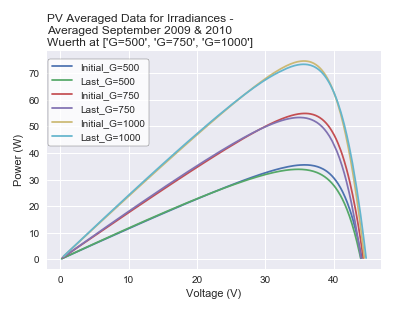

['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 0, inital_colour is #4C72B0, last_colour is #55A868
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 1, inital_colour is #C44E52, last_colour is #8172B2
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])
['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD']
irr_i is 2, inital_colour is #CCB974, last_colour is #64B5CD
cycler('color', ['#4C72B0', '#55A868', '#C44E52', '#8172B2', '#CCB974', '#64B5CD'])


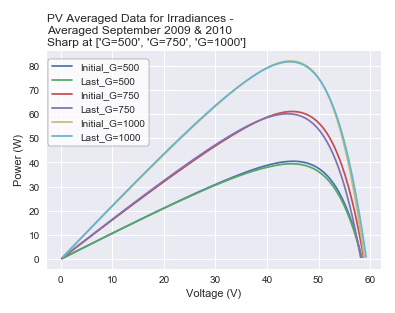

In [13]:

for panel_i, panel in enumerate(panel_arr) :
    for irr_i, irr in enumerate(panel) : 
        
        color_cycle = plt.rcParams['axes.prop_cycle'].by_key()["color"]
        print(color_cycle)

        if irr_i == G_1000:
            #Initial color is pink    
            initial_color = color_cycle[irr_i*2]
            last_color = color_cycle[irr_i*2+1]
        else:
            initial_color = color_cycle[irr_i*2]
            last_color = color_cycle[irr_i*2+1]
            #plt.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')
        print('irr_i is {}, inital_colour is {}, last_colour is {}'.format(irr_i,initial_color, last_color))
        print(plt.rcParams['axes.prop_cycle'])
        plt.plot(
            panel_voltage_avg_start_arr[panel_i][irr_i],
            [a*b for a,b in zip(panel_voltage_avg_start_arr[panel_i][irr_i],panel_current_avg_start_arr[panel_i][irr_i])],
            label='Initial_'+irr_names_arr[irr_i]
            ,color=initial_color
        )
        plt.plot(
            panel_voltage_avg_end_arr[panel_i][irr_i],
            [a*b for a,b in zip(panel_voltage_avg_end_arr[panel_i][irr_i],panel_current_avg_end_arr[panel_i][irr_i])],
            label='Last_'+irr_names_arr[irr_i]
            ,color=last_color
        )
    
    plt.title('PV Averaged Data for Irradiances - \nAveraged September 2009 & 2010\n{panel} at {irr}'.format(panel=panel_names_arr[panel_i], irr=irr_names_arr),loc='left')
    plt.ylabel('Power (W)')
    plt.xlabel('Voltage (V)')
    #Change this for position
    #We've already got figlengend entries from the plots
    #plt.figlegend(loc="best")
    plt.figlegend(loc="upper left",bbox_to_anchor=(0.1,0.9)) 
    plt.savefig('PV_AVG_inital_last_for_{}_at_all_irr.svg'.format(panel_names_arr[panel_i]))
    plt.show()


In [14]:
#don't need this any more
def plot_IV(voltage, current, title):
    plt.plot(voltage[0],current[0],'-')
    plt.plot(voltage[len(voltage)-1],current[len(current)-1], '-')
    plt.figlegend(('IV_Initial','IV_Last'))
    plt.ylabel('Current (A)')
    plt.xlabel('Voltage (V)')
    plt.title(title)
    plt.show()
    

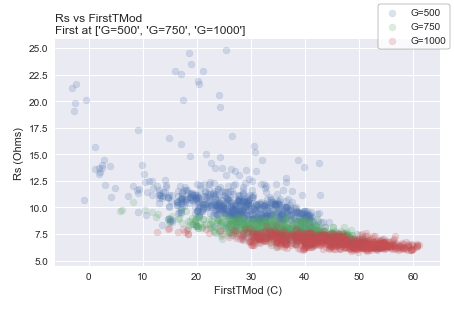

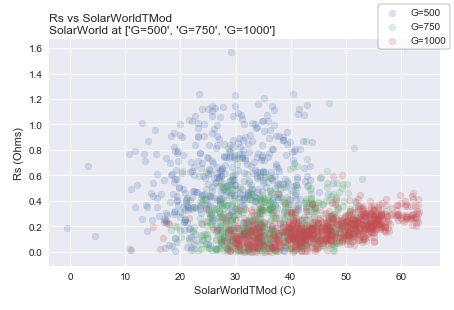

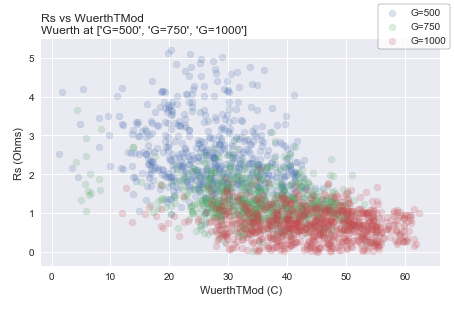

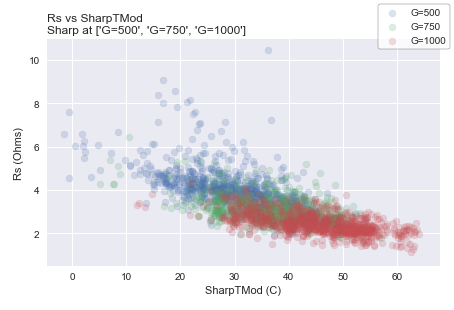

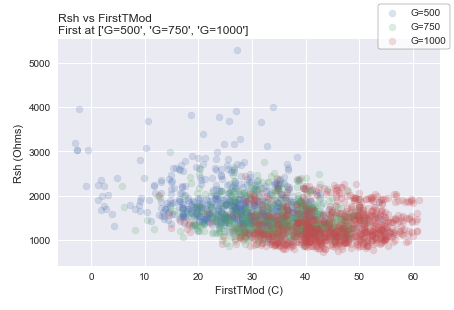

...

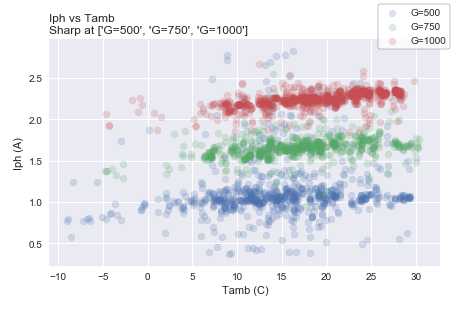

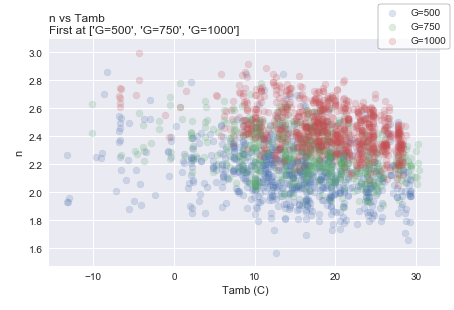

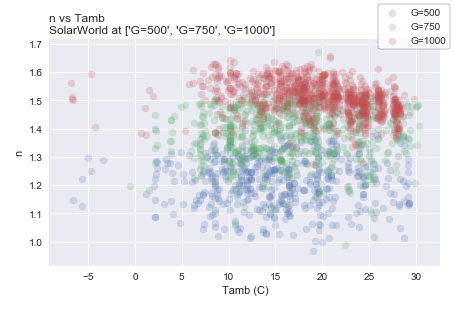

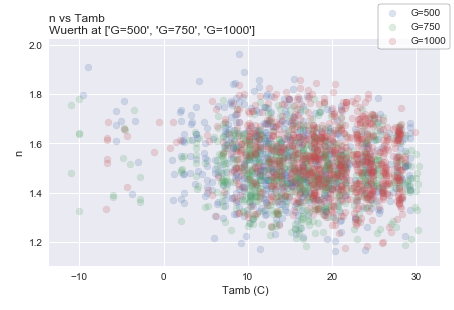

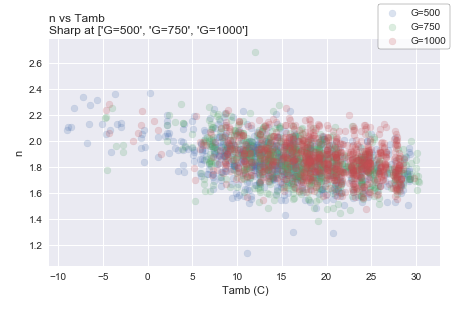

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


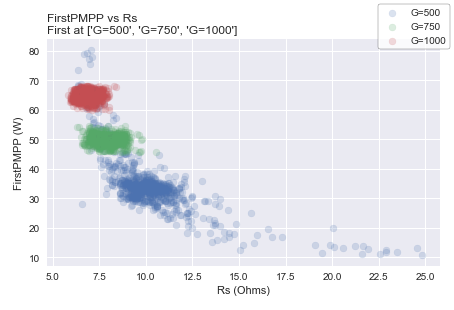

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


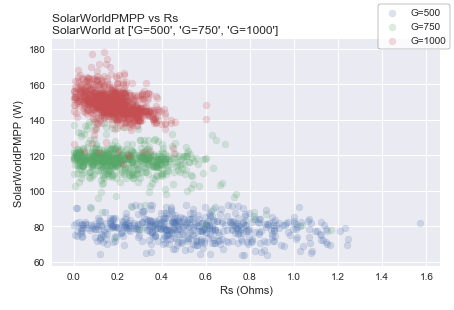

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


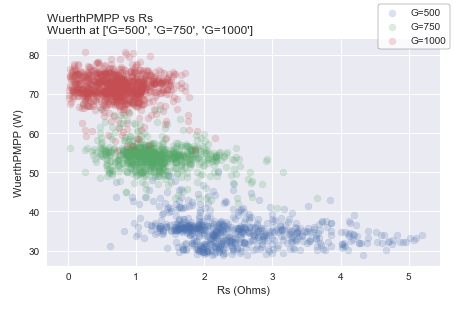

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


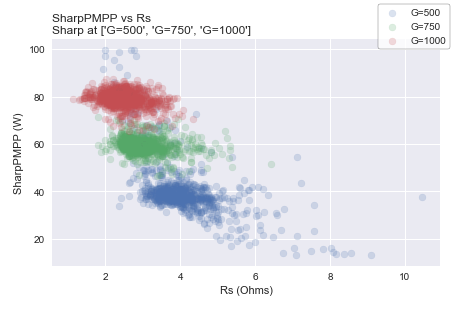

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


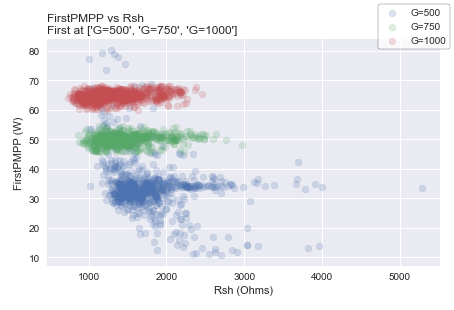

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


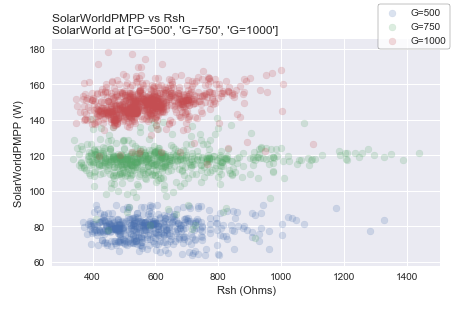

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


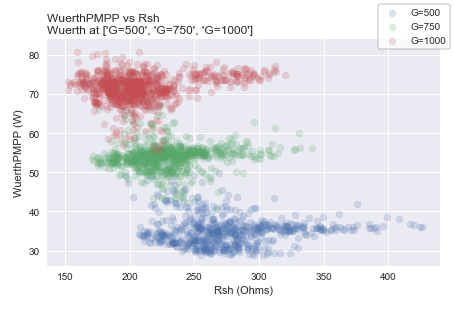

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


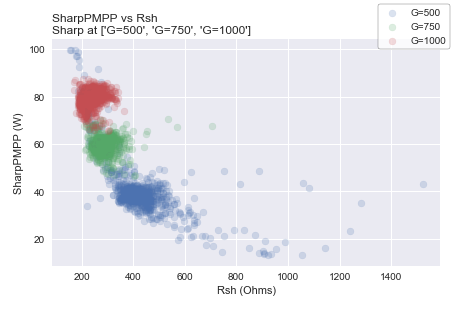

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


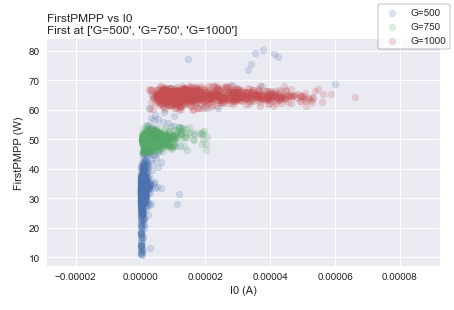

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


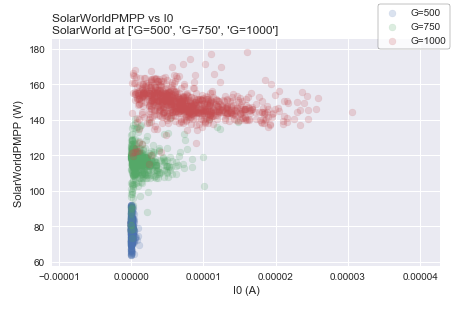

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


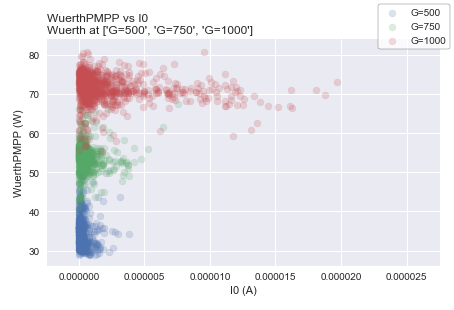

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


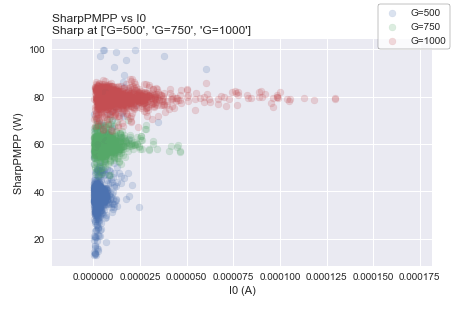

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


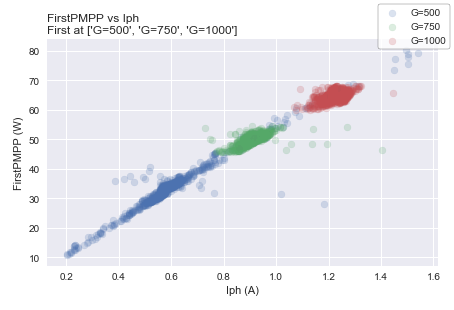

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


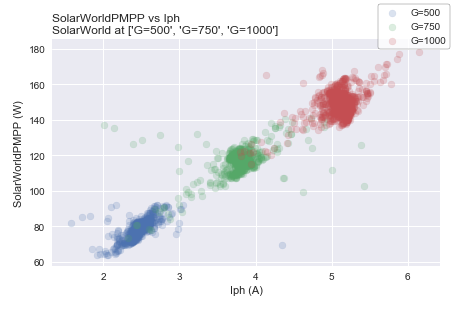

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


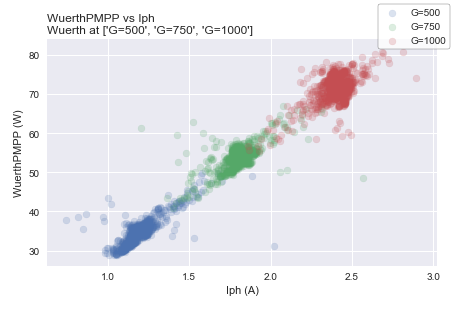

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


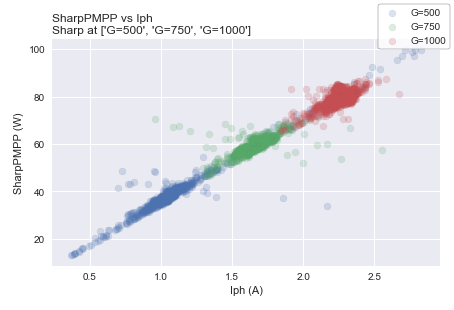

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


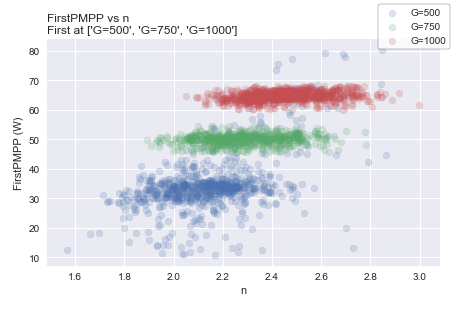

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


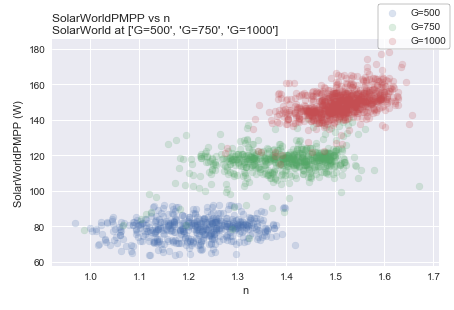

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


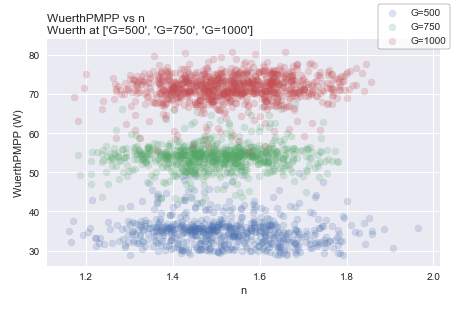

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


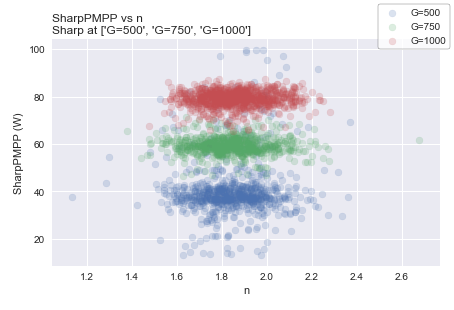

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


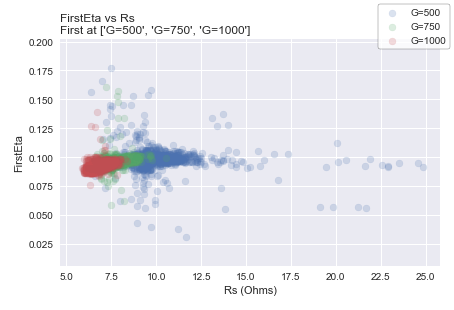

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


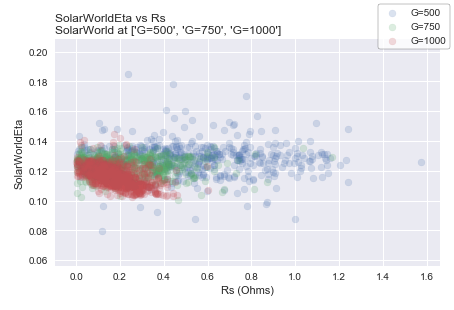

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


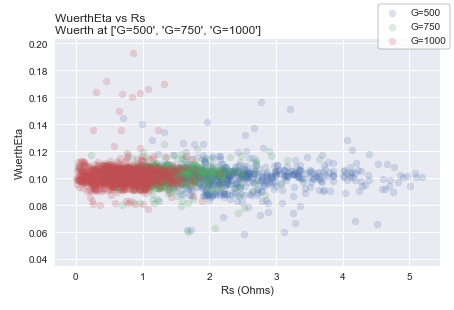

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


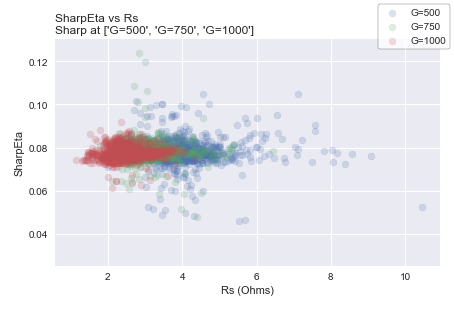

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


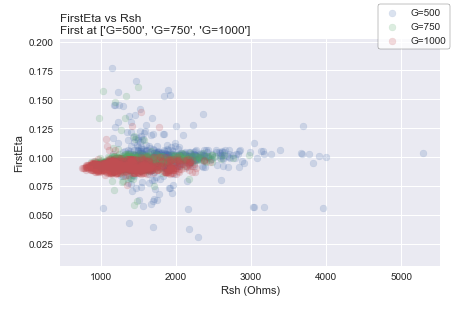

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


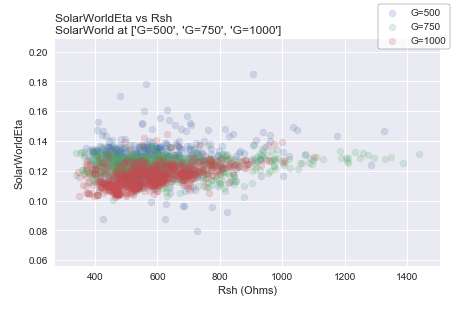

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


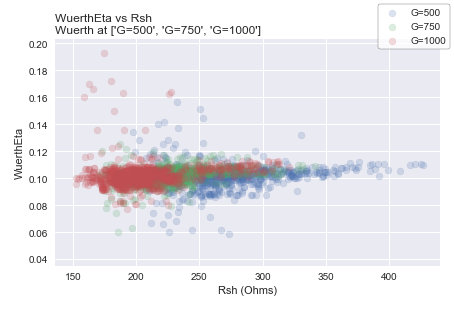

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


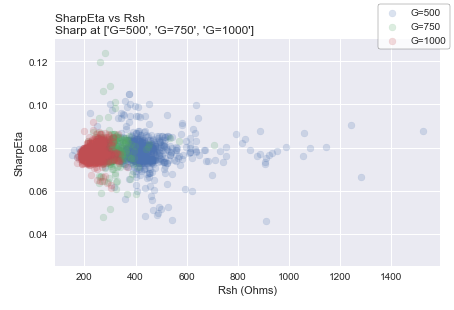

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


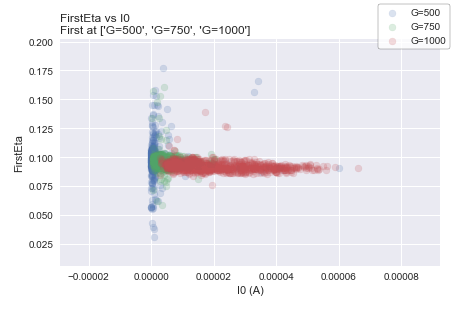

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


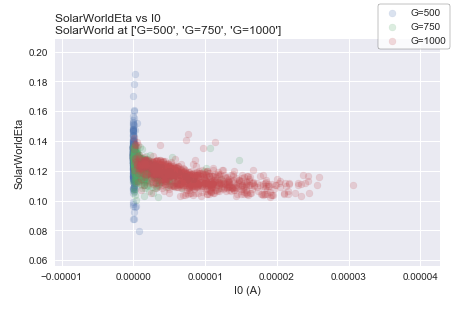

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


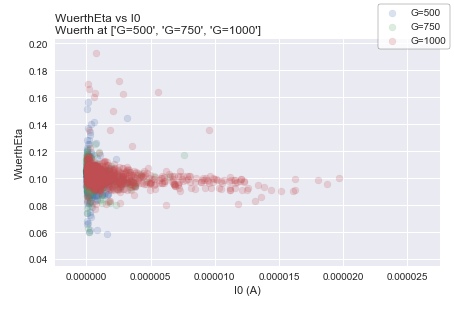

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


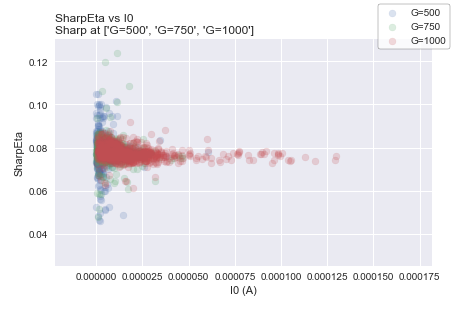

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


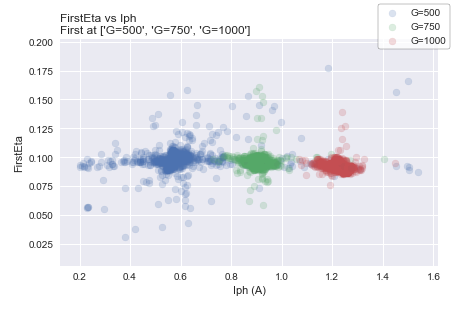

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


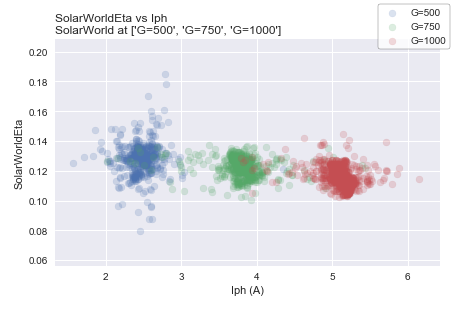

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


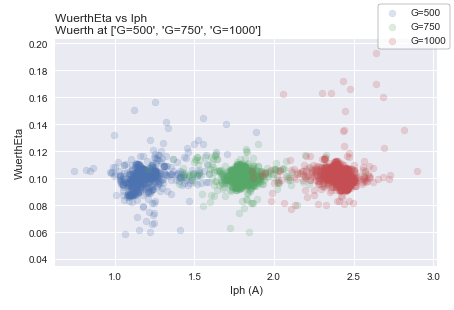

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


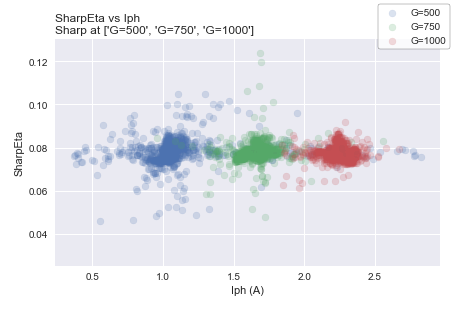

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


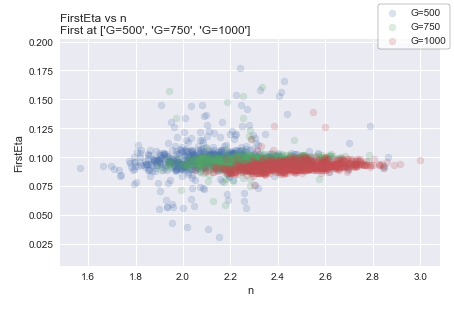

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


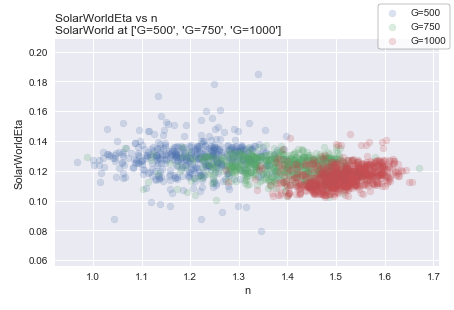

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


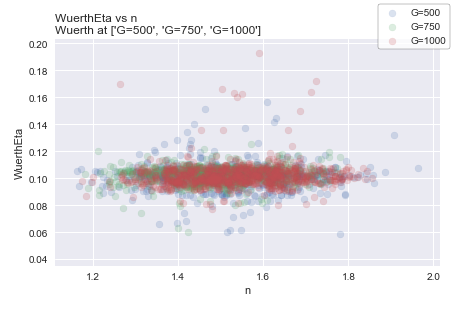

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


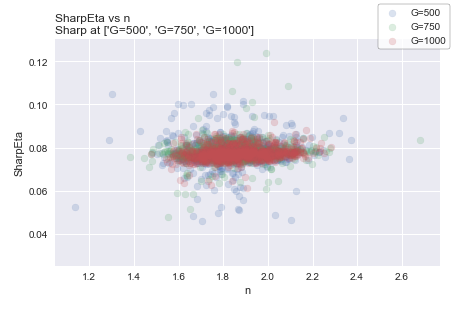

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


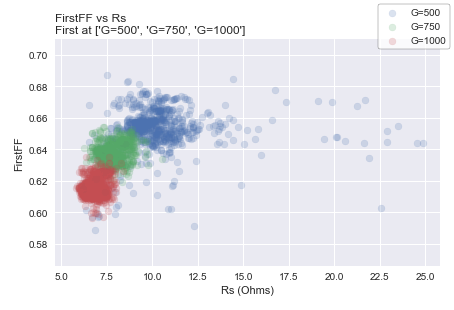

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


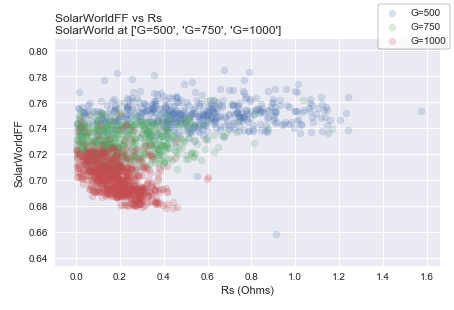

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


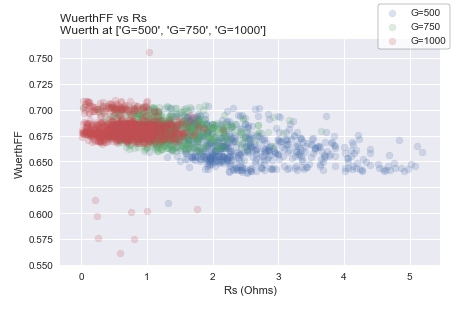

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


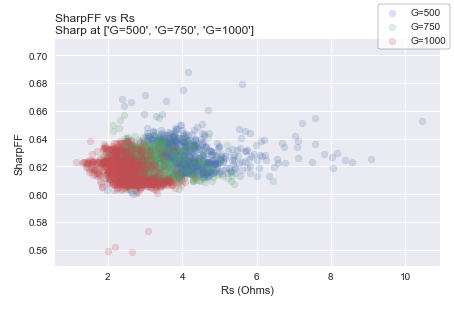

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


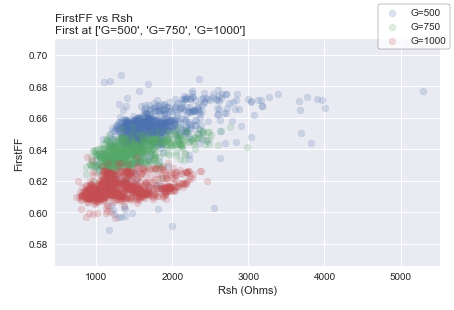

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


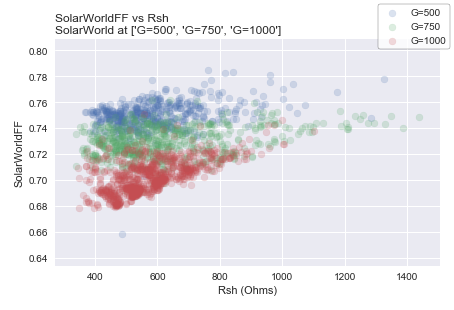

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


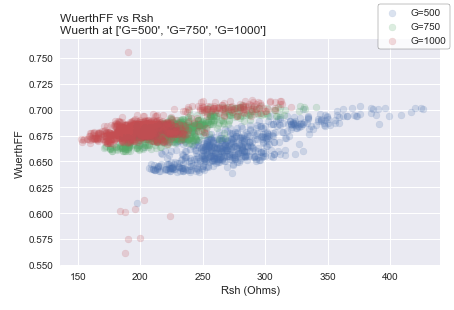

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


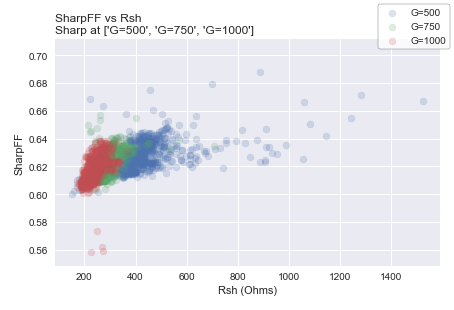

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


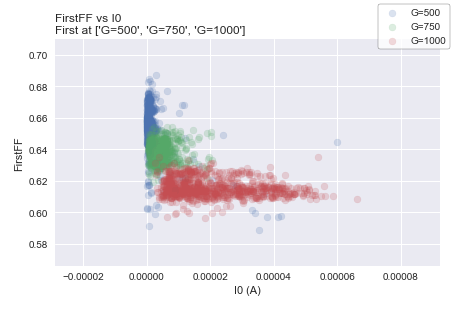

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


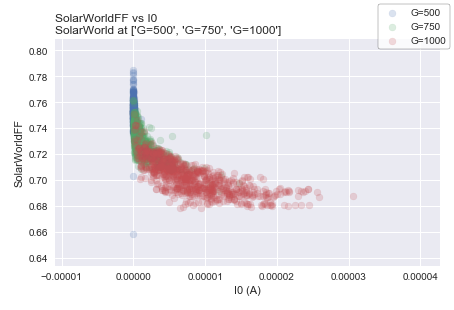

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


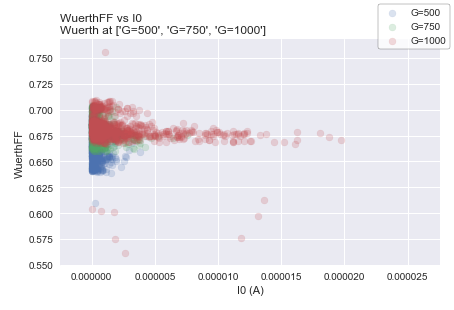

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


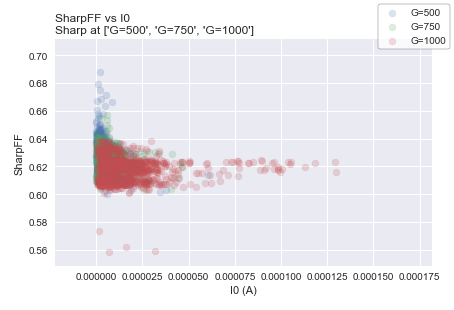

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


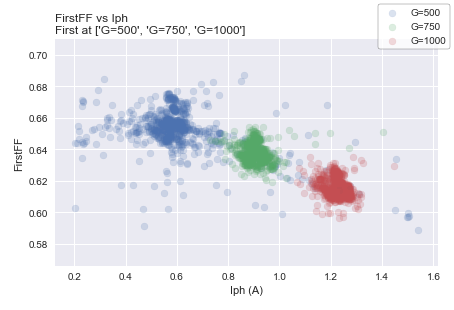

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


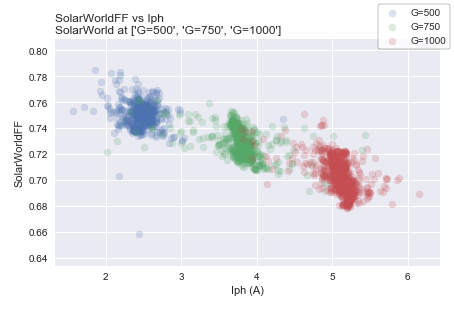

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


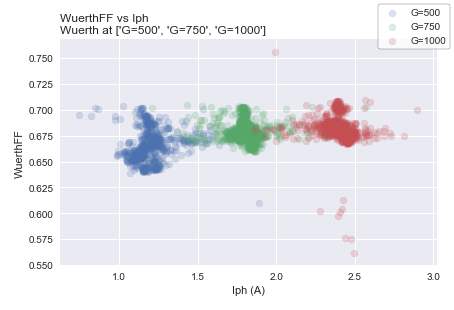

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


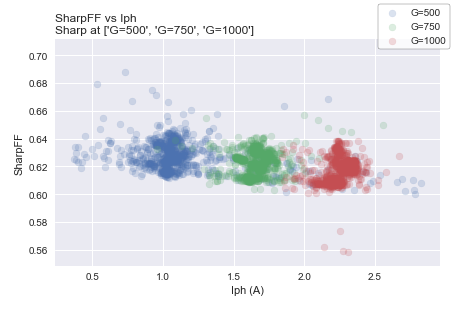

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First


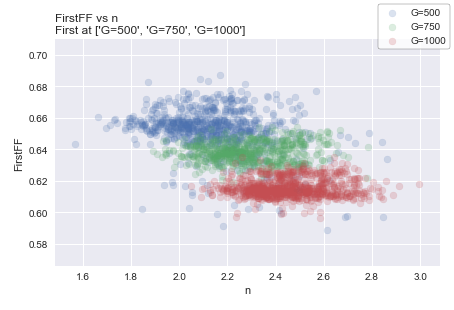

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld


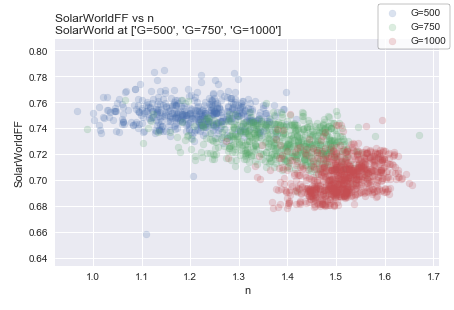

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth


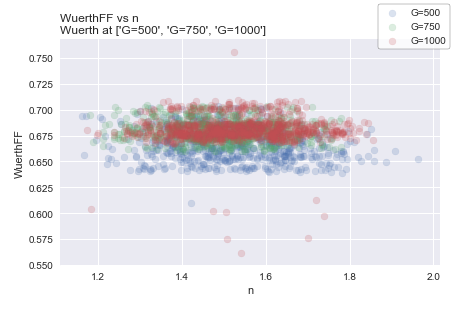

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp


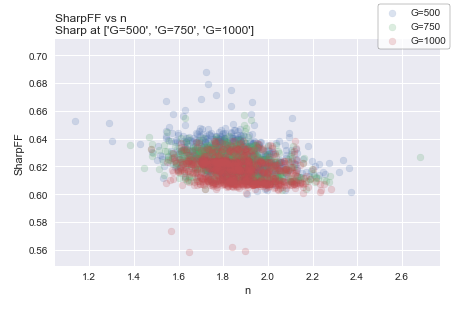

In [15]:
#print(df1.columns)



# Ideally, we'd define a class containing information about all the possible characteristics, what its units and rules should be. 
elec_chars = [
    ['Rs','Ohms']
    ,['Rsh','Ohms']
    ,['I0','A']
    ,['Iph','A']
    ,['n','']
]
temps = [
    ['TMod','C']
    ,['Tamb','C']
    ,['PMPP','W']
    ,['Eta','']
    ,['FF','']
]
swap_list = [
    ['PMPP','W']
    ,['Eta','']
    ,['FF','']
]
panel_specific_cols = [
    'TMod', 'PMPP','Eta', 'FF'
]

check_irrs = [
    G_500
    ,G_750
    ,G_1000
]
check_panels = [
    First
    ,SolarWorld
    ,Wurth 
    ,Sharp
]
need_lim = False
for temp in temps:    
    for elec_char in elec_chars:
        for panel_i, panel in enumerate(panel_arr) :
            if panel_i in check_panels:
                plt.subplots(constrained_layout=True)
                
                for specific_col in panel_specific_cols:
                    if specific_col in temp[0]:
                        temp[0] = panel_names_arr[panel_i]+specific_col
                #This is inefficient
                swap_port = []
                for char_i,swap_char in enumerate(swap_list): 
                    #print([panel_names_arr[panel_i]+specific_col for specific_col in panel_specific_cols])
                    #print(swap_char[0])
                    if panel_names_arr[panel_i]+swap_char[0] in [panel_names_arr[panel_i]+specific_col for specific_col in panel_specific_cols]:
                        swap_port.append(panel_names_arr[panel_i]+swap_list[char_i][0])
                        #print('{} matches {}. Panel: {}. swap_port {}'.format(panel_specific_cols,swap_char[0], panel_names_arr[panel_i], swap_port ))
                for irr_i, df in enumerate(panel) :
                    if irr_i in check_irrs:
                        
                        if elec_char[0] == 'I0':
                            need_lim = True
                        else:
                            need_lim = False
                        #print("BeforePortSwap - {} might matches {} \t panel is {}".format(temp[0],swap_port, panel_names_arr[panel_i]))
                        if temp[0] in swap_port:
                            print("PortSwap - {} matches {} \t panel is {}".format(temp[0],swap_port, panel_names_arr[panel_i]))
                        #if temp[0] in swap_char[0] for swap_char in swap_list:
                            # Swap Axis
                            scatter_label(
                                df
                                ,y_param=temp[0]
                                ,x_param=elec_char[0]
                                ,y_units=temp[1]
                                ,x_units=elec_char[1]
                                ,get_x_lim=need_lim
                            )
                        else:
                            scatter_label(
                                df
                                ,x_param=temp[0]
                                ,y_param=elec_char[0]
                                ,y_units=elec_char[1]
                                ,x_units=temp[1],
                                get_y_lim=need_lim
                            )
                if [True for swap_char in swap_list if swap_char[0] in temp[0]]:
                    plt.title('{} vs {} \n{panel} at {irr}'.format(temp[0], elec_char[0], panel=panel_names_arr[panel_i], irr=irr_names_arr)
                             ,loc='left')
                else:    
                    plt.title('{} vs {} \n{panel} at {irr}'.format(elec_char[0], temp[0], panel=panel_names_arr[panel_i], irr=irr_names_arr)
                             ,loc='left')
                    
                #plt.title('{temp} vs {elec_char} for {dfs}'.format(elec_char=elec_char, temp=temp, dfs=df_arr_names))
                #plt.figure(figsize=(5,6))
                #plt.subplots(constrained_layout=True)
                plt.figlegend((irr_names_arr))#,bbox_to_anchor=(0.9,0.9))
                plt.savefig('{temp}_vs_{elec_char}_for_{panel}_at_all_irr.svg'.format(elec_char=elec_char[0], temp=temp[0], panel=panel_names_arr[panel_i]))
                plt.show()



p is [-0.03502581  8.3725438 ]
cov is [[ 1.94869531e-06 -8.59565053e-05]
 [-8.59565053e-05  3.93564038e-03]]
Final covariance is -2.590384221945065. Then correlation is -0.6467699328720233


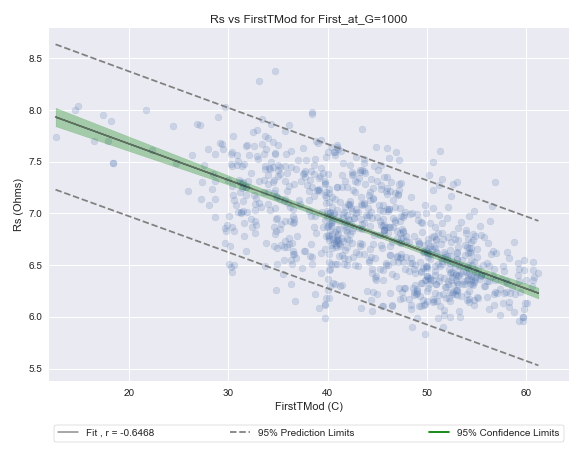

p is [ 0.00524716 -0.05628718]
cov is [[ 9.18657683e-08 -4.16500826e-06]
 [-4.16500826e-06  1.96624968e-04]]
Final covariance is 0.44505558374507176. Then correlation is 0.5106349792577433


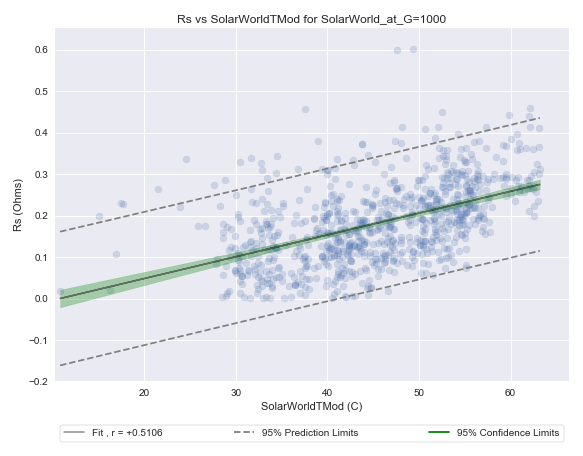

p is [-0.00669859  1.02228969]
cov is [[ 1.78814916e-06 -7.78023320e-05]
 [-7.78023320e-05  3.53552979e-03]]
Final covariance is -0.5632340686035118. Then correlation is -0.16116148430462332


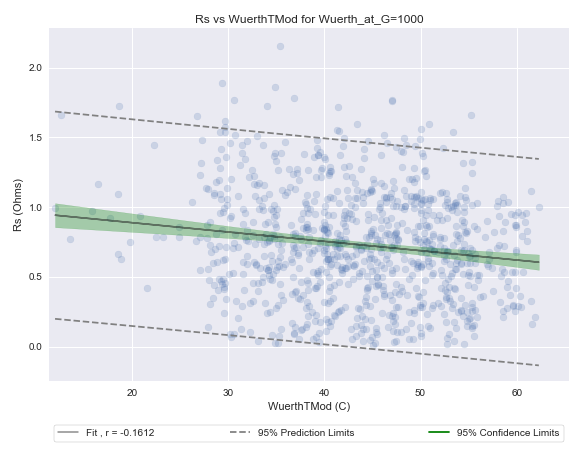

p is [-0.03254838  3.9314258 ]
cov is [[ 2.09736632e-06 -9.36551143e-05]
 [-9.36551143e-05  4.34719670e-03]]
Final covariance is -2.562937826333223. Then correlation is -0.5922203062531275


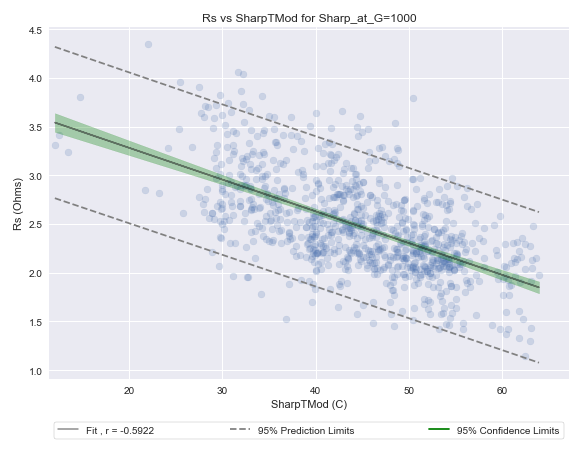

p is [   2.98633225 1190.59490025]
cov is [[ 1.84317529e+00 -8.13020413e+01]
 [-8.13020413e+01  3.72252915e+03]]
Final covariance is 220.85848504901267. Then correlation is 0.07419915316908518


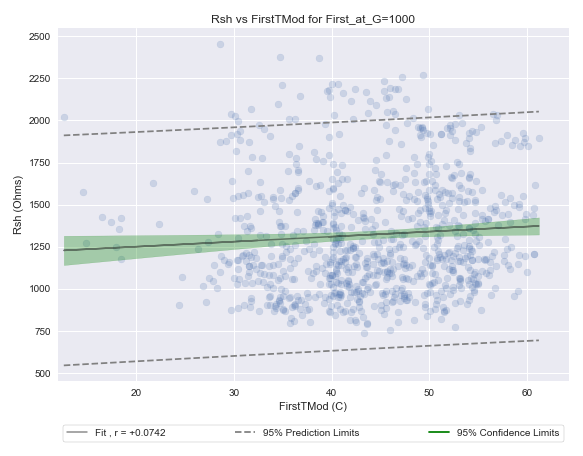

p is [ -6.75947964 881.30886255]
cov is [[ 1.29779965e-01 -5.88396129e+00]
 [-5.88396129e+00  2.77774648e+02]]
Final covariance is -573.3285838025805. Then correlation is -0.541225218407944


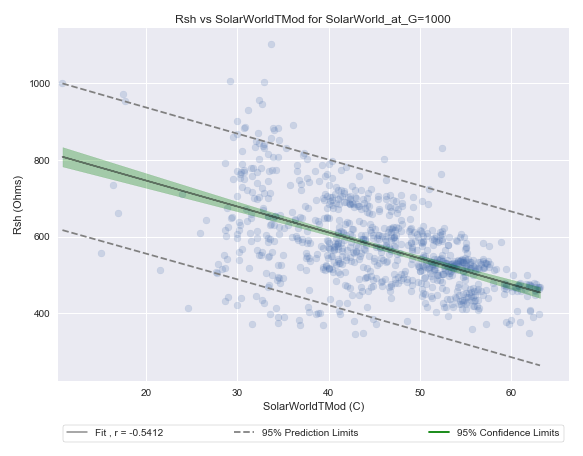

p is [ -0.30139896 220.48774347]
cov is [[ 1.12558313e-02 -4.89740981e-01]
 [-4.89740981e-01  2.22550376e+01]]
Final covariance is -25.342364786267037. Then correlation is -0.09221487687322297


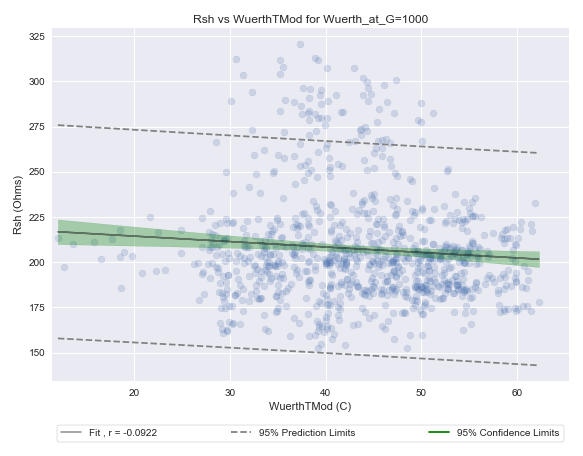

p is [  1.36447921 175.25111871]
cov is [[ 1.12445040e-02 -5.02108429e-01]
 [-5.02108429e-01  2.33064059e+01]]
Final covariance is 107.44236364594548. Then correlation is 0.3879855254498642


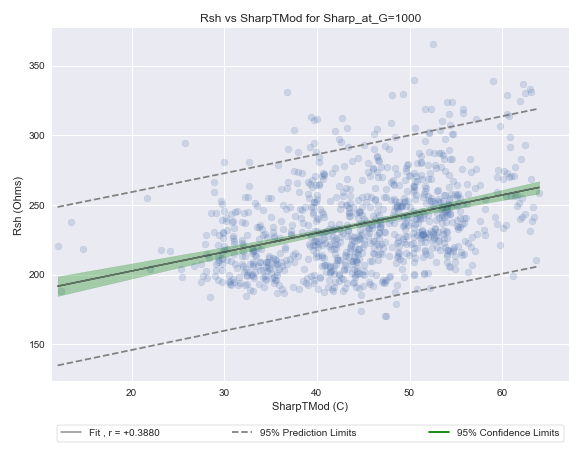

p is [0.00274385 1.10316771]
cov is [[ 1.30757010e-08 -5.76766185e-07]
 [-5.76766185e-07  2.64080570e-05]]
Final covariance is 0.20292511427602342. Then correlation is 0.6299127222454934


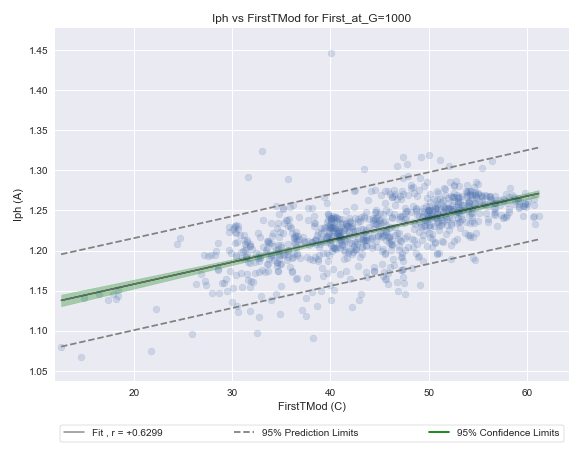

p is [0.00778262 4.74178772]
cov is [[ 5.99134514e-07 -2.71635479e-05]
 [-2.71635479e-05  1.28235802e-03]]
Final covariance is 0.6601096789374865. Then correlation is 0.3261573505598973


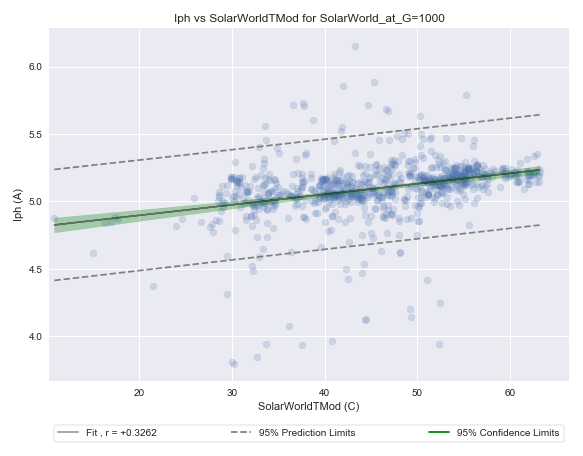

p is [0.00341992 2.25108249]
cov is [[ 1.06225374e-07 -4.62186377e-06]
 [-4.62186377e-06  2.10028885e-04]]
Final covariance is 0.287555007162671. Then correlation is 0.32361702518006535


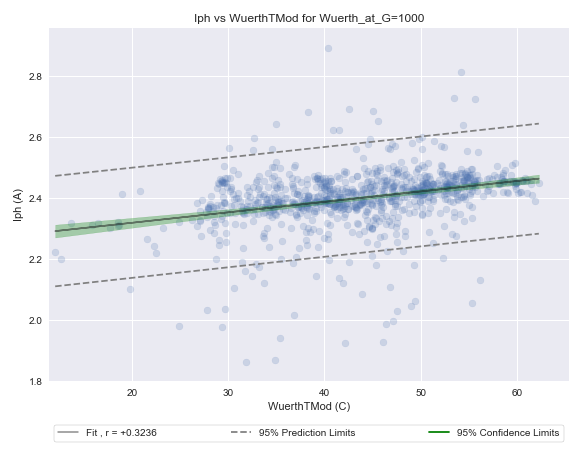

p is [0.00582147 1.98685021]
cov is [[ 8.80659566e-08 -3.93246862e-06]
 [-3.93246862e-06  1.82533701e-04]]
Final covariance is 0.4583965069920626. Then correlation is 0.5400093109302565


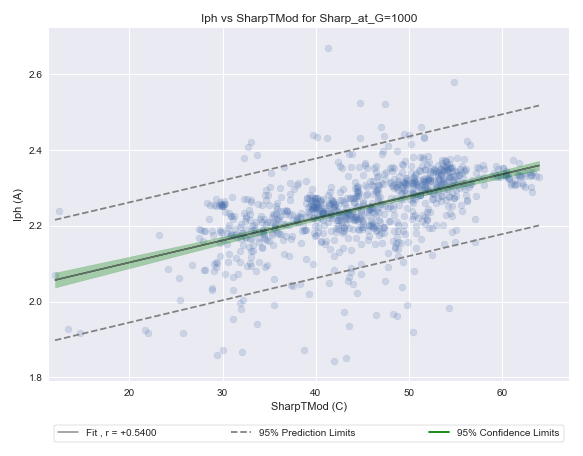

p is [-0.00854115  2.83091547]
cov is [[ 2.70506475e-07 -1.19319789e-05]
 [-1.19319789e-05  5.46322557e-04]]
Final covariance is -0.631672981070005. Then correlation is -0.48546565847780837


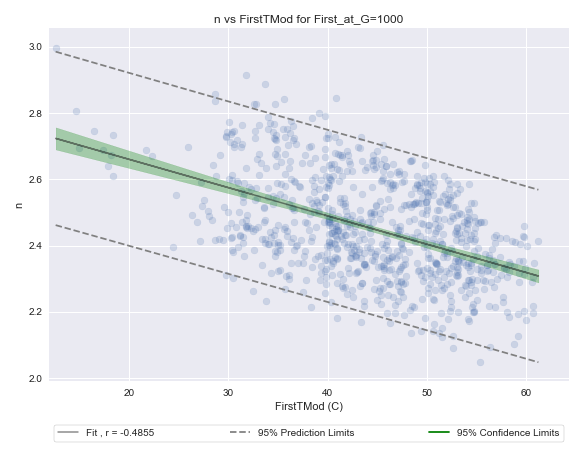

p is [-0.00243185  1.6194676 ]
cov is [[ 3.95792996e-08 -1.79444545e-06]
 [-1.79444545e-06  8.47135846e-05]]
Final covariance is -0.20626551344048966. Then correlation is -0.3867859641993735


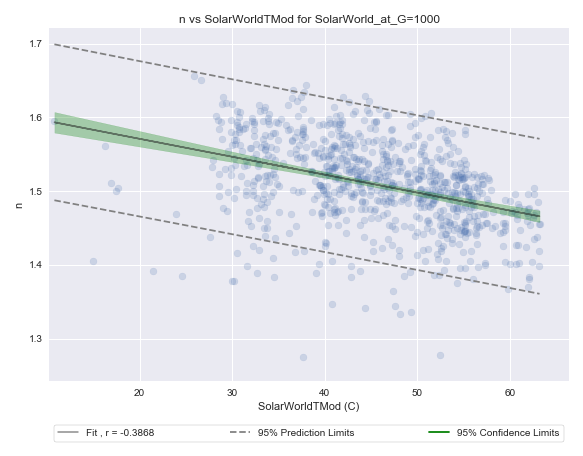

p is [-0.00172657  1.60717585]
cov is [[ 1.90998582e-07 -8.31034425e-06]
 [-8.31034425e-06  3.77642532e-04]]
Final covariance is -0.14517427573707567. Then correlation is -0.12773089414435362


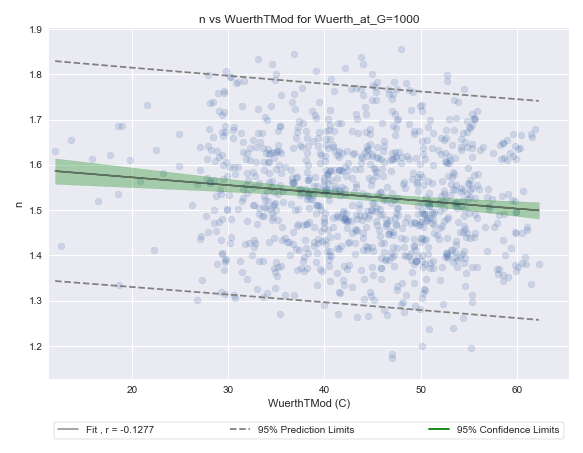

p is [-0.00541835  2.10282063]
cov is [[ 2.17522399e-07 -9.71317456e-06]
 [-9.71317456e-06  4.50857177e-04]]
Final covariance is -0.4266539587670432. Then correlation is -0.35528367635588015


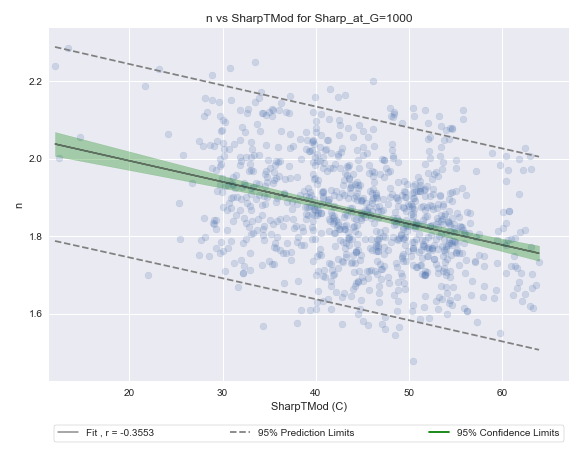

p is [-0.04674828  7.71688523]
cov is [[ 3.84674304e-06 -7.31790168e-05]
 [-7.31790168e-05  1.54239725e-03]]
Final covariance is -1.8261448434399932. Then correlation is -0.627370448048511


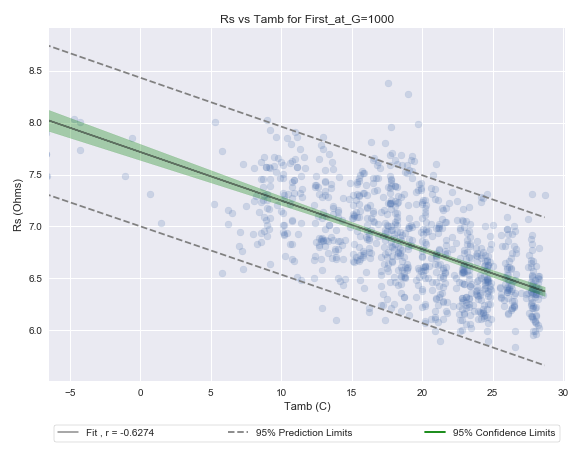

p is [0.0077696  0.03000889]
cov is [[ 2.26674824e-07 -4.42284934e-06]
 [-4.42284934e-06  9.43236668e-05]]
Final covariance is 0.2750891022809325. Then correlation is 0.4885144395009798


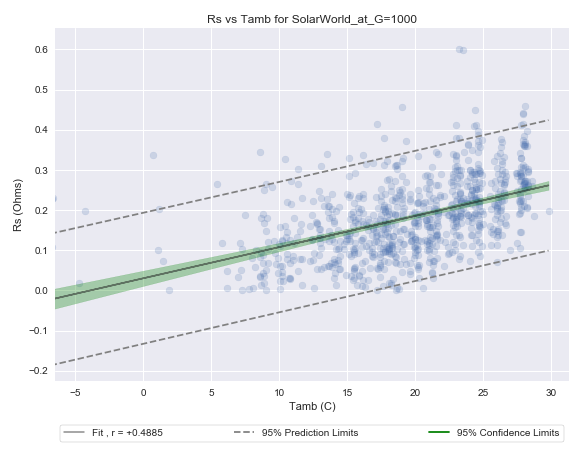

p is [-0.00772403  0.8770107 ]
cov is [[ 3.85708858e-06 -7.29950945e-05]
 [-7.29950945e-05  1.53329464e-03]]
Final covariance is -0.3041243865933461. Then correlation is -0.12716645205260135


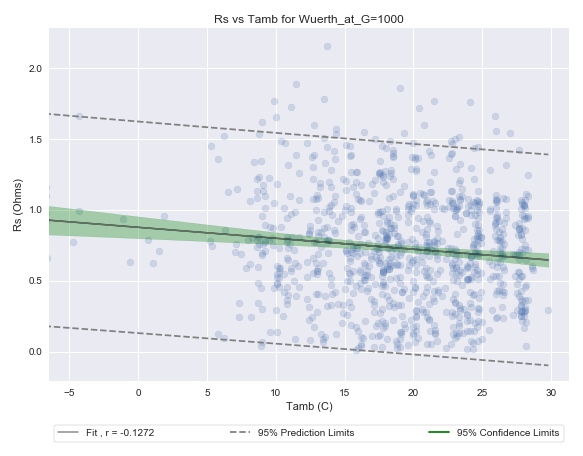

p is [-0.04591612  3.35356168]
cov is [[ 4.84481021e-06 -9.23821454e-05]
 [-9.23821454e-05  1.93516839e-03]]
Final covariance is -1.6452808239465182. Then correlation is -0.563575540085603


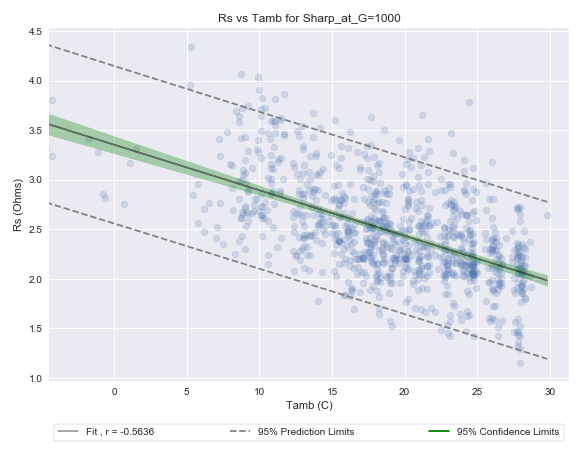

p is [   7.40170161 1181.5141    ]
cov is [[   3.44611471  -65.55761166]
 [ -65.55761166 1381.76056651]]
Final covariance is 289.1353136002262. Then correlation is 0.13365622716483525


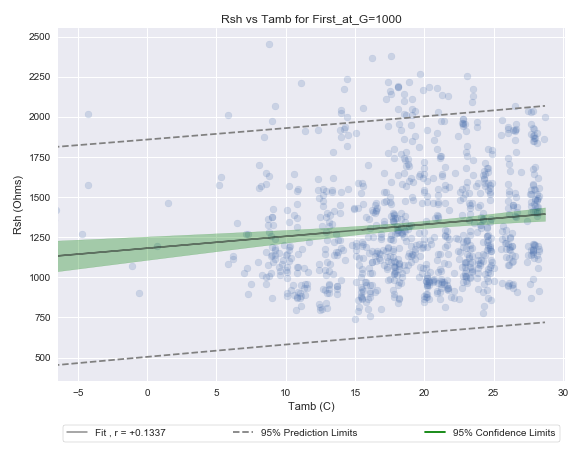

p is [ -8.52193508 741.12659352]
cov is [[  0.35438837  -6.91477923]
 [ -6.91477923 147.46768022]]
Final covariance is -301.7262729492994. Then correlation is -0.44085449170158547


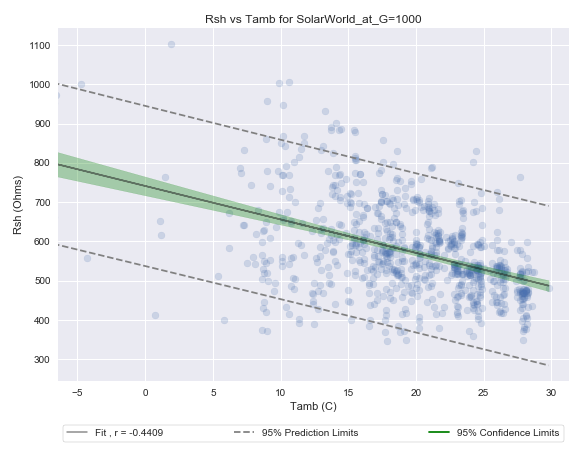

p is [ -0.3177512  213.38729738]
cov is [[ 0.02413581 -0.45676819]
 [-0.45676819  9.59462033]]
Final covariance is -12.511075845810423. Then correlation is -0.06652692897868526


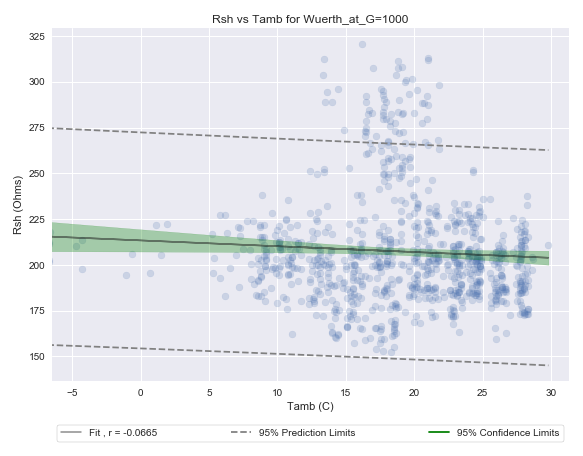

p is [  2.66087266 185.4418941 ]
cov is [[ 0.02150312 -0.41002723]
 [-0.41002723  8.58901608]]
Final covariance is 95.34522949918436. Then correlation is 0.5103942987200367


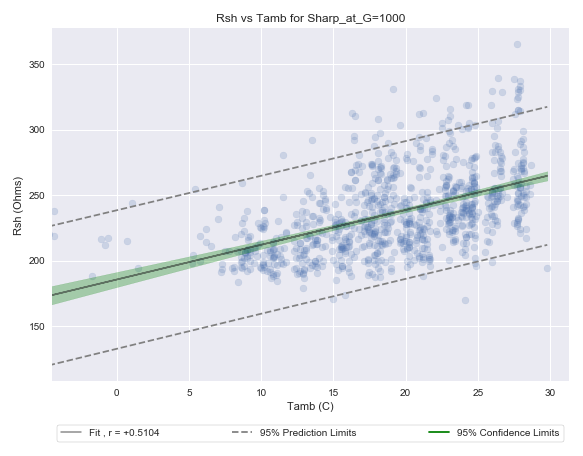

p is [0.00373525 1.15314019]
cov is [[ 2.51013266e-08 -4.77518353e-07]
 [-4.77518353e-07  1.00646746e-05]]
Final covariance is 0.14591129998738386. Then correlation is 0.6232132923387886


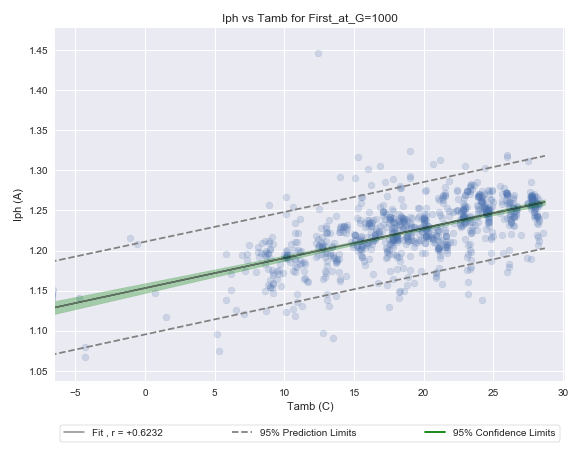

p is [0.01183364 4.86373955]
cov is [[ 1.44127010e-06 -2.81218726e-05]
 [-2.81218726e-05  5.99739656e-04]]
Final covariance is 0.4189798999215717. Then correlation is 0.32041435917216776


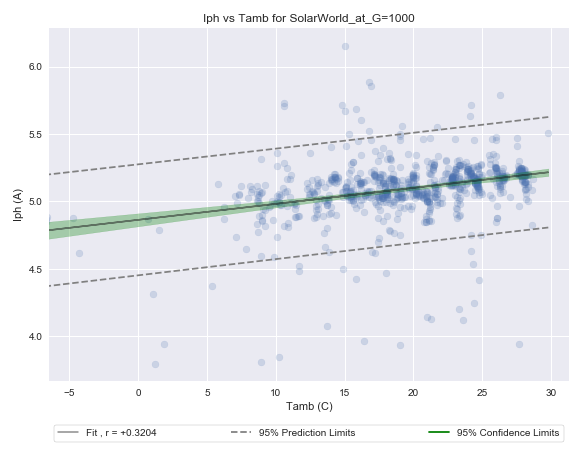

p is [0.00501068 2.30505626]
cov is [[ 2.26704378e-07 -4.29036233e-06]
 [-4.29036233e-06  9.01209813e-05]]
Final covariance is 0.1972895951396389. Then correlation is 0.3244618013429956


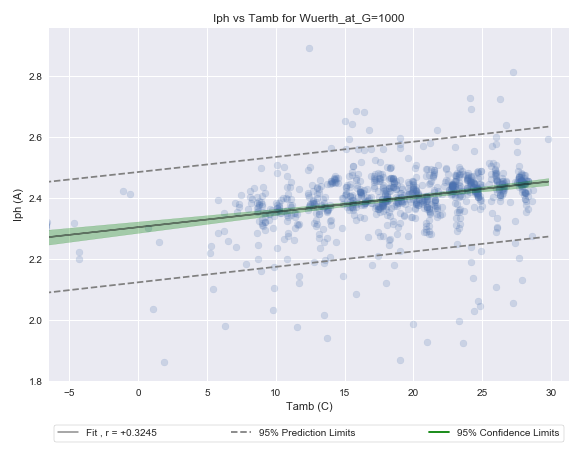

p is [0.0091208  2.07288237]
cov is [[ 1.84175225e-07 -3.51190277e-06]
 [-3.51190277e-06  7.35653323e-05]]
Final covariance is 0.32681939722575704. Then correlation is 0.5707351881154628


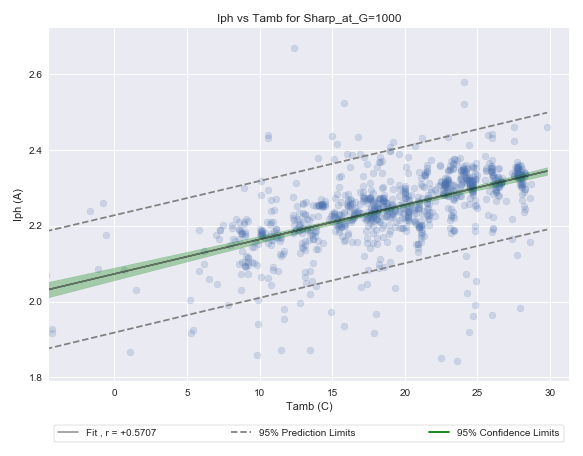

p is [-0.0103933   2.65188558]
cov is [[ 5.46645744e-07 -1.03991864e-05]
 [-1.03991864e-05  2.19184094e-04]]
Final covariance is -0.4059971517196642. Then correlation is -0.4293311500305904


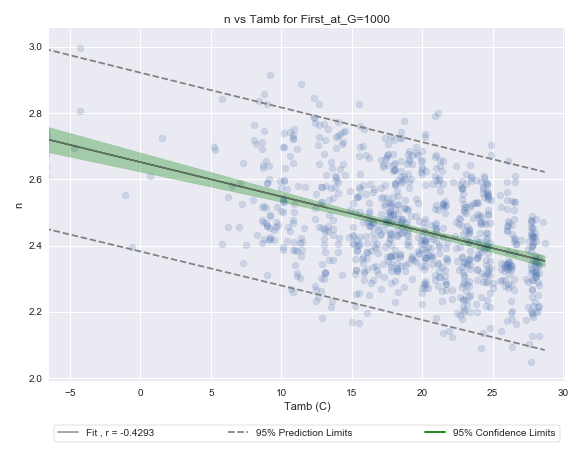

p is [-0.00327776  1.57316777]
cov is [[ 9.88584735e-08 -1.92891352e-06]
 [-1.92891352e-06  4.11368742e-05]]
Final covariance is -0.11605182217252022. Then correlation is -0.33682456646809833


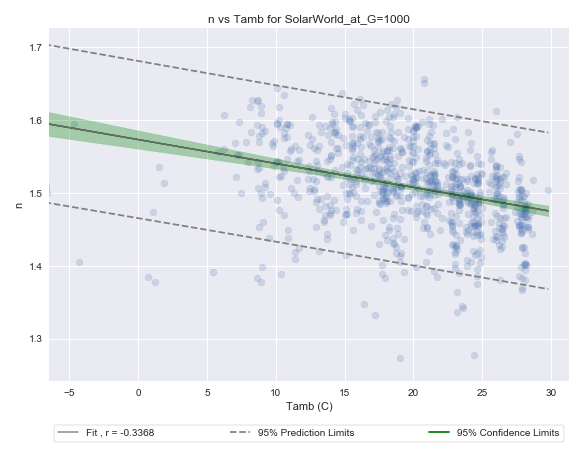

p is [-0.00284164  1.58583056]
cov is [[ 4.06056012e-07 -7.68457773e-06]
 [-7.68457773e-06  1.61417995e-04]]
Final covariance is -0.11188607098310292. Then correlation is -0.14385709099288277


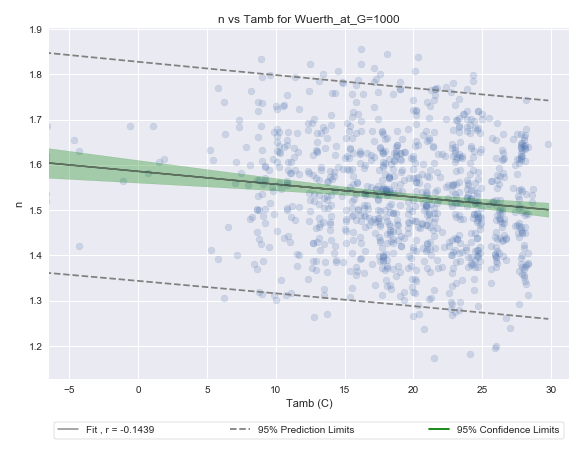

p is [-0.00786652  2.01087233]
cov is [[ 4.80836905e-07 -9.16872756e-06]
 [-9.16872756e-06  1.92061265e-04]]
Final covariance is -0.2818757522212164. Then correlation is -0.3479557910951621


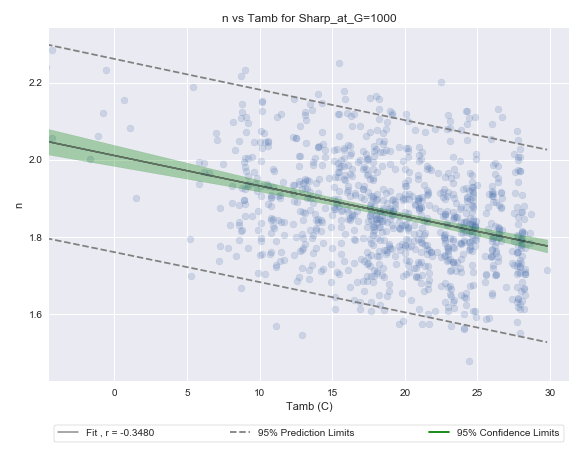

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP
p is [ 0.24800754 62.95213224]
cov is [[ 0.01305432 -0.08912918]
 [-0.08912918  0.6113601 ]]
Final covariance is 0.05366925220083669. Then correlation is 0.07322566800738393


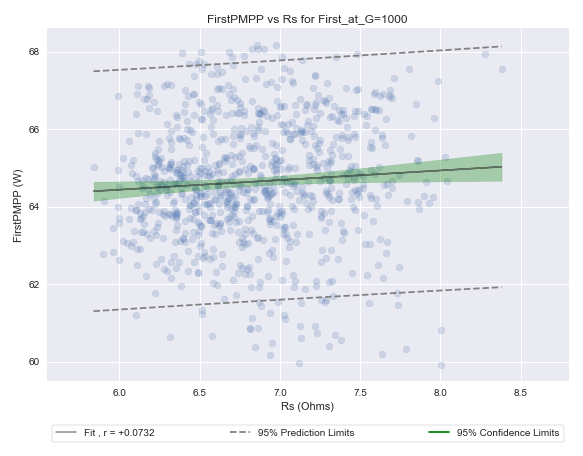

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP
p is [-32.17488936 154.68783608]
cov is [[ 5.81281611 -1.05565531]
 [-1.05565531  0.24365336]]
Final covariance is -0.2874834504735195. Then correlation is -0.4163239944078082


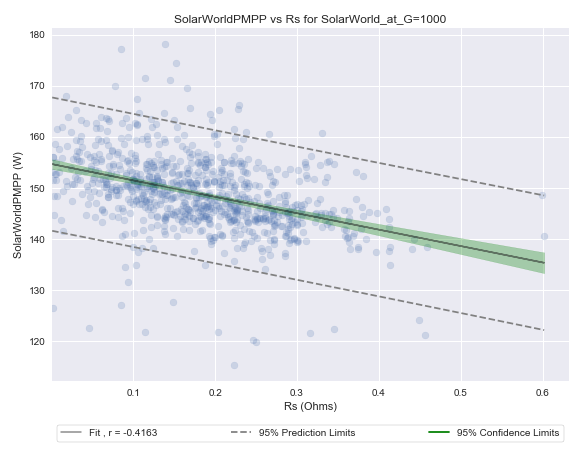

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP
p is [-1.09822418 72.3489446 ]
cov is [[ 0.08465915 -0.06187179]
 [-0.06187179  0.05748964]]
Final covariance is -0.15919130544642024. Then correlation is -0.12212108719595818


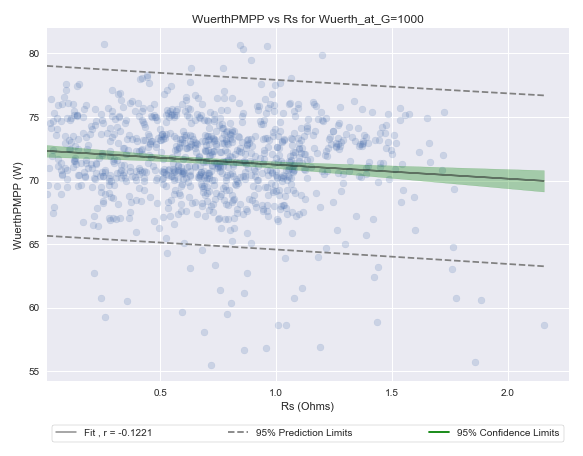

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP
p is [-1.89232977 83.79882622]
cov is [[ 0.04745648 -0.11759813]
 [-0.11759813  0.30267398]]
Final covariance is -0.44912710919912574. Then correlation is -0.2733830836478409


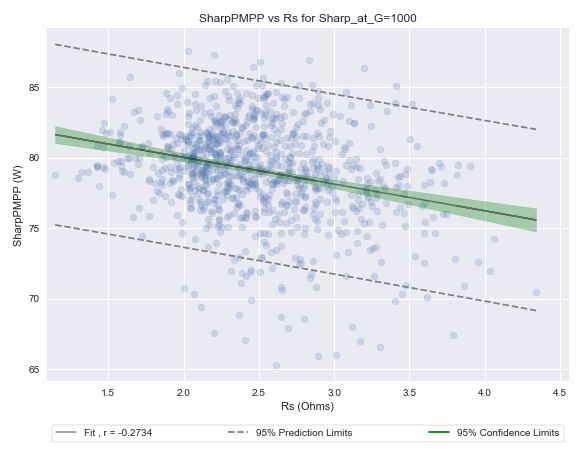

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP
p is [1.04669523e-03 6.32613520e+01]
cov is [[ 2.25061560e-08 -2.97603703e-05]
 [-2.97603703e-05  4.20428422e-02]]
Final covariance is 125.10724286341349. Then correlation is 0.22967804093250768


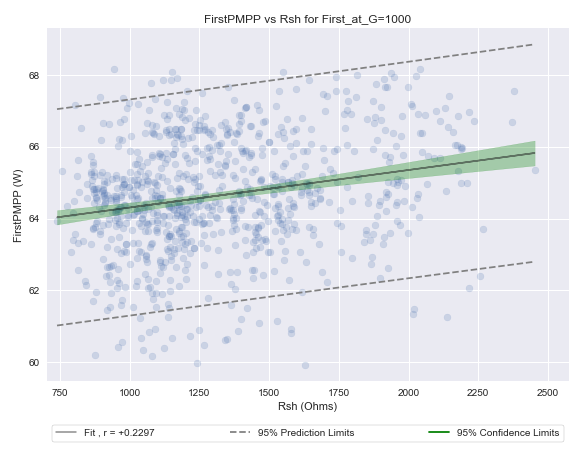

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP
p is [1.61881095e-02 1.39538913e+02]
cov is [[ 4.45297458e-06 -2.55978228e-03]
 [-2.55978228e-03  1.53025961e+00]]
Final covariance is 213.66612489193508. Then correlation is 0.2545847523960104


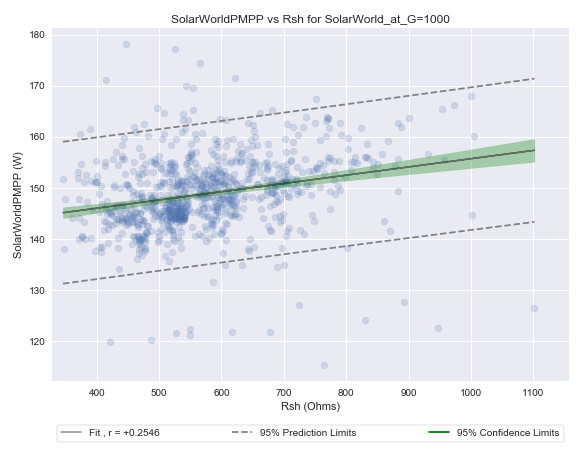

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP
p is [2.10404837e-02 6.71830782e+01]
cov is [[ 1.34273140e-05 -2.78447421e-03]
 [-2.78447421e-03  5.89462457e-01]]
Final covariance is 18.859103392188477. Then correlation is 0.18398137899298345


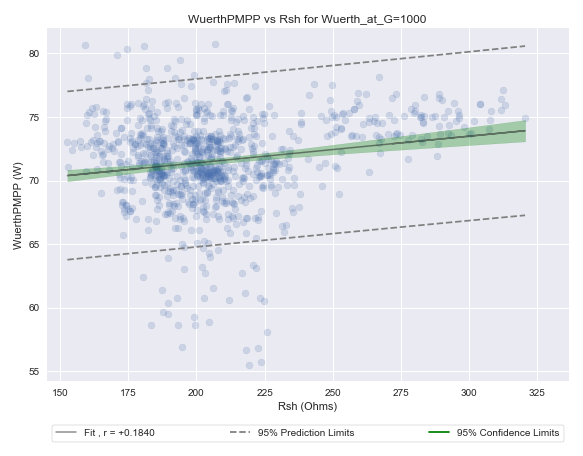

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP
p is [2.38640978e-02 7.34733680e+01]
cov is [[ 1.19173497e-05 -2.81464121e-03]
 [-2.81464121e-03  6.76343770e-01]]
Final covariance is 23.19145390865162. Then correlation is 0.2206099470193885


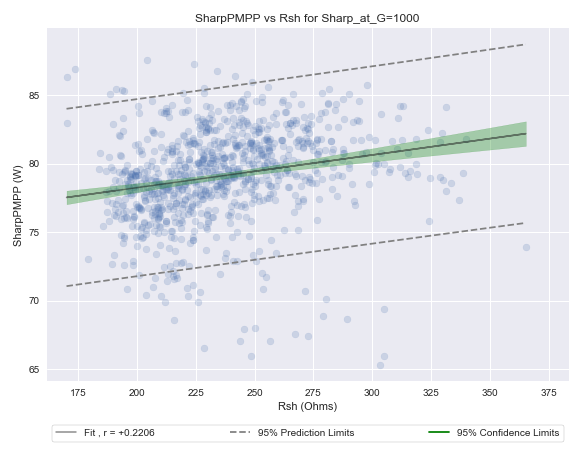

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP
p is [20.20260124 39.91343225]
cov is [[ 1.56061828 -1.91050602]
 [-1.91050602  2.34102288]]
Final covariance is 0.02828460118094619. Then correlation is 0.4797851504019705


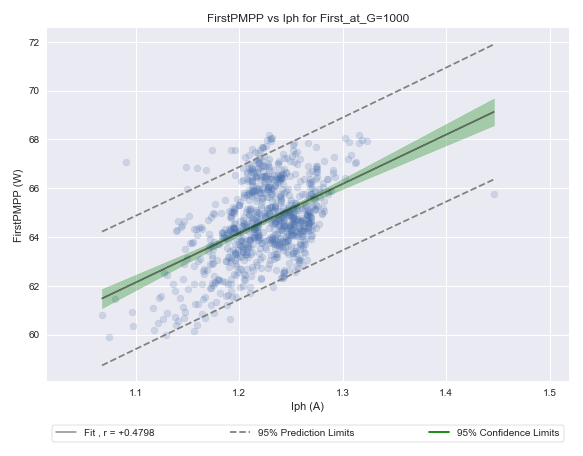

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP
p is [16.02721076 67.19180717]
cov is [[ 1.0013841  -5.1016874 ]
 [-5.1016874  26.03948657]]
Final covariance is 0.7721900640121824. Then correlation is 0.48156793825999866


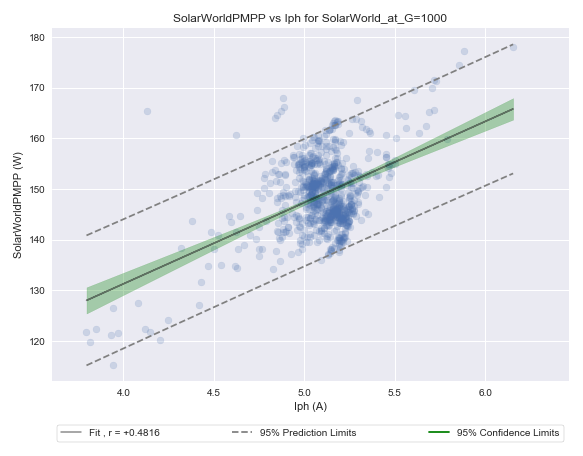

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP
p is [20.34698386 22.71594437]
cov is [[ 0.88860978 -2.13255949]
 [-2.13255949  5.12621976]]
Final covariance is 0.19065676280720265. Then correlation is 0.5752566095977847


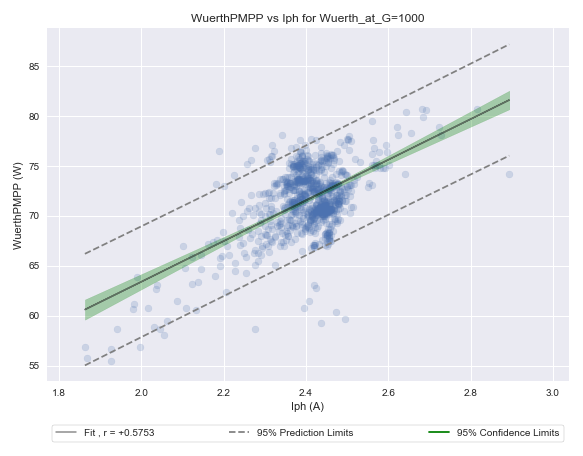

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP
p is [24.86060156 23.25278798]
cov is [[ 0.67017993 -1.50576044]
 [-1.50576044  3.38926268]]
Final covariance is 0.22701504017084115. Then correlation is 0.7044849567810784


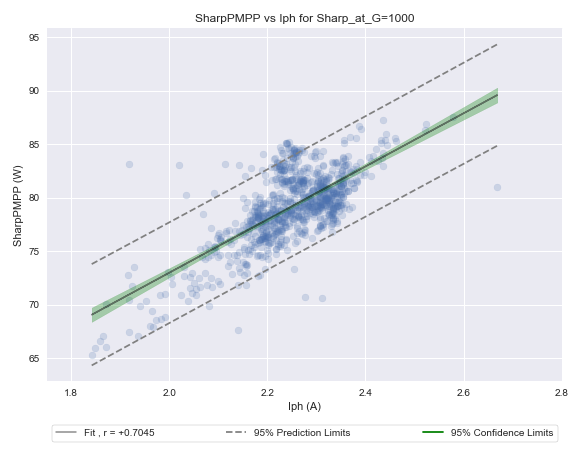

PortSwap - FirstPMPP matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstPMPP
p is [ 2.11599361 59.45241705]
cov is [[ 0.11921816 -0.29258131]
 [-0.29258131  0.72076644]]
Final covariance is 0.04832967296150807. Then correlation is 0.2029701773291758


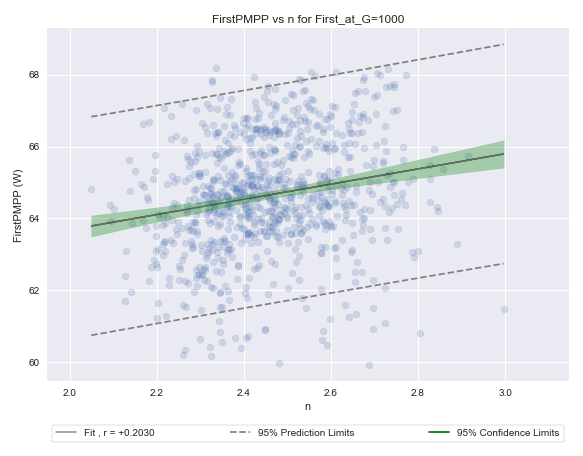

PortSwap - SolarWorldPMPP matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldPMPP
p is [63.35889042 53.22257752]
cov is [[ 14.05203771 -21.20751187]
 [-21.20751187  32.0536479 ]]
Final covariance is 0.21193749478591262. Then correlation is 0.5016192170098231


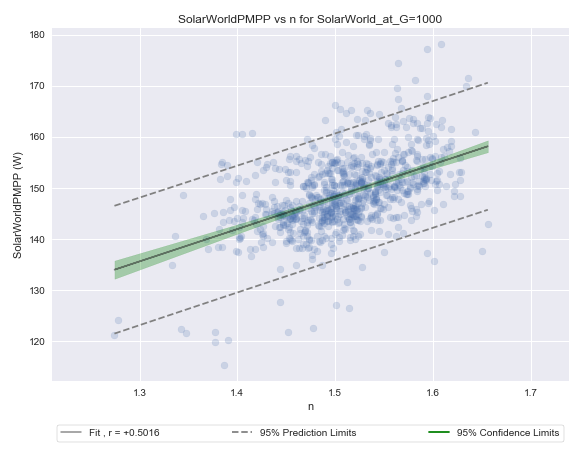

PortSwap - WuerthPMPP matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthPMPP
p is [ 3.26535466 66.54362914]
cov is [[ 0.80125334 -1.22756244]
 [-1.22756244  1.89297421]]
Final covariance is 0.05005999687549381. Then correlation is 0.11808536544573148


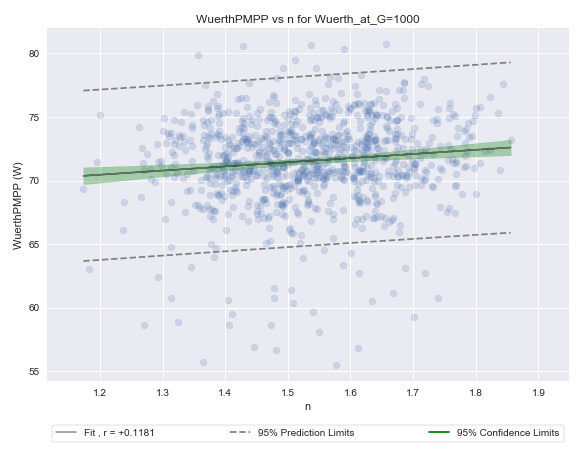

PortSwap - SharpPMPP matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpPMPP
p is [ 1.42597504 76.45603761]
cov is [[ 0.66403335 -1.23568063]
 [-1.23568063  2.31157807]]
Final covariance is 0.026060087530564227. Then correlation is 0.05716530026366753


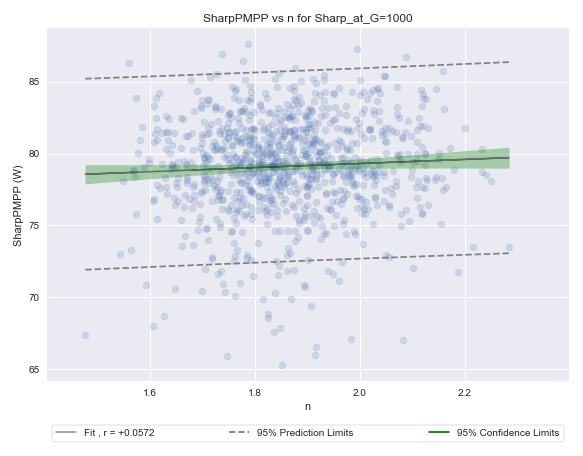

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta
p is [0.00347581 0.06861225]
cov is [[ 7.50447543e-08 -5.12372803e-07]
 [-5.12372803e-07  3.51449750e-06]]
Final covariance is 0.000752171437310935. Then correlation is 0.3943232958049078


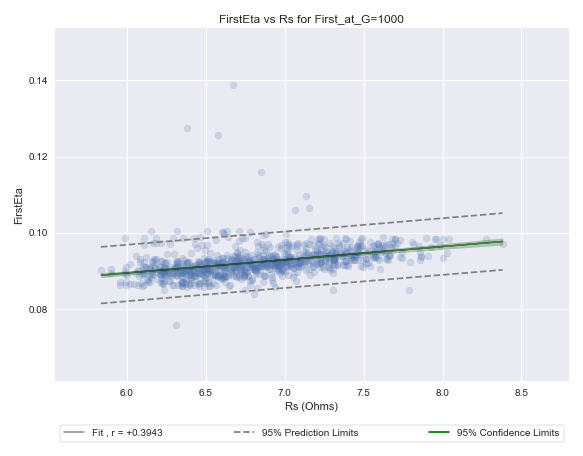

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta
p is [-0.03511721  0.12239865]
cov is [[ 4.28852078e-06 -7.78830713e-07]
 [-7.78830713e-07  1.79760117e-07]]
Final covariance is -0.00031377314576359173. Then correlation is -0.5028533564926293


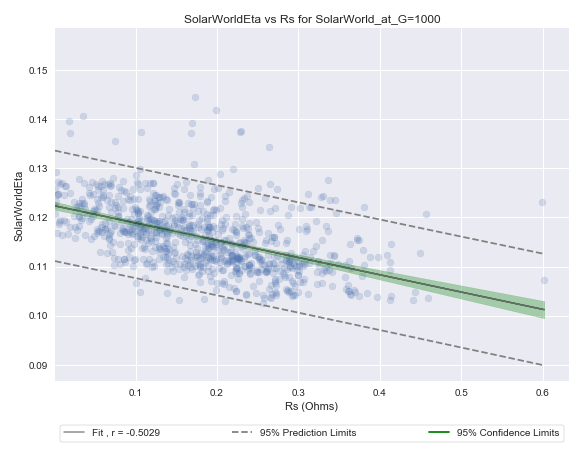

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta
p is [0.00035506 0.10163472]
cov is [[ 5.68252707e-07 -4.15298455e-07]
 [-4.15298455e-07  3.85884422e-07]]
Final covariance is 5.146701915603572e-05. Then correlation is 0.015352709479313893


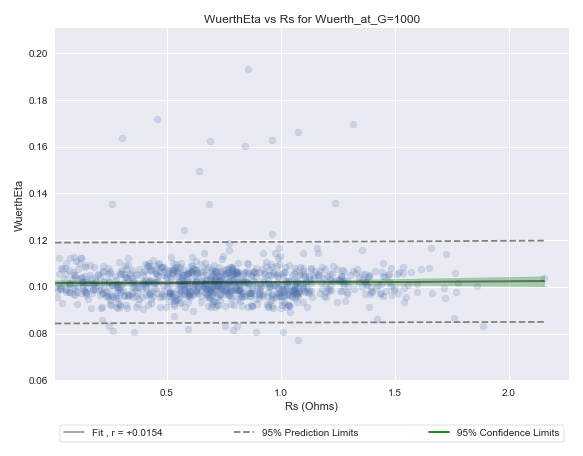

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta
p is [0.00065154 0.07579577]
cov is [[ 4.31081610e-08 -1.06822919e-07]
 [-1.06822919e-07  2.74940742e-07]]
Final covariance is 0.00015463701231537125. Then correlation is 0.10214256053976095


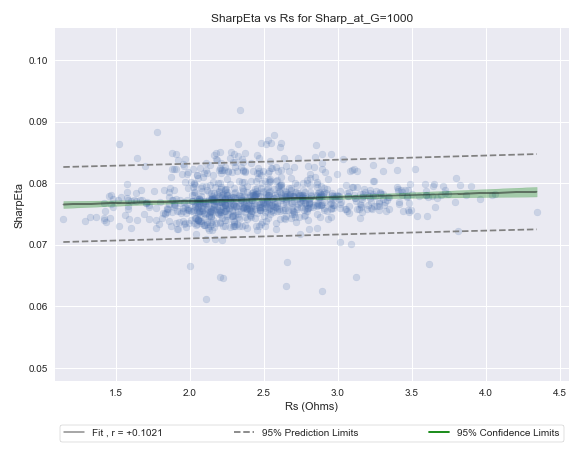

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta
p is [8.50732456e-07 9.12186276e-02]
cov is [[ 1.60122376e-13 -2.11733234e-10]
 [-2.11733234e-10  2.99118152e-07]]
Final covariance is 0.10168460619733694. Then correlation is 0.07172821648362009


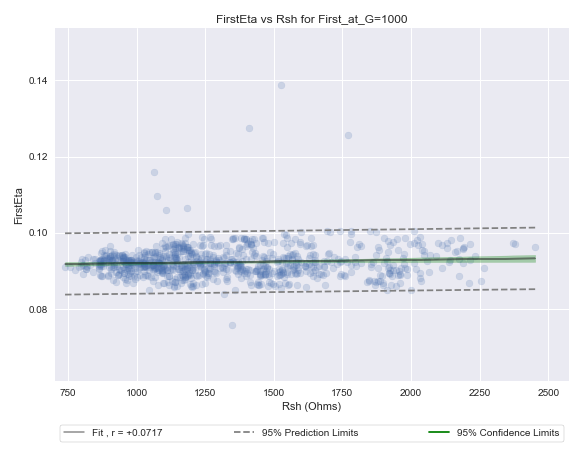

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta
p is [2.89359856e-05 9.93872864e-02]
cov is [[ 2.90020181e-12 -1.66717439e-09]
 [-1.66717439e-09  9.96651028e-07]]
Final covariance is 0.3819247648678193. Then correlation is 0.5035951330038627


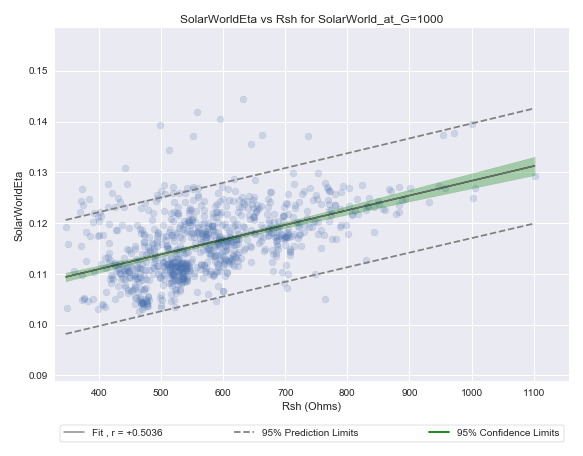

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta
p is [4.97307903e-05 9.15813444e-02]
cov is [[ 8.92855749e-11 -1.85154962e-08]
 [-1.85154962e-08  3.91965917e-06]]
Final covariance is 0.04457493139864281. Then correlation is 0.1690940047773038


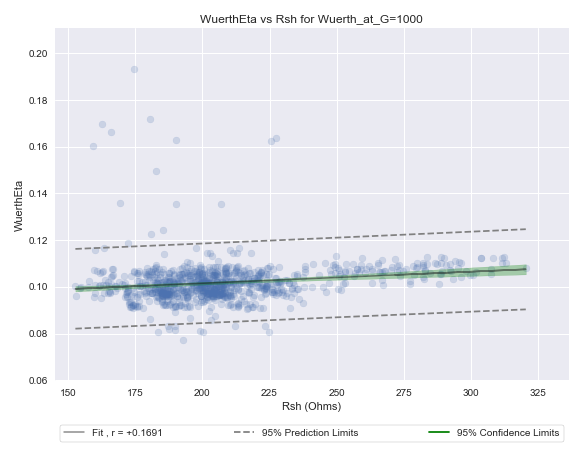

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta
p is [1.01953540e-05 7.50023609e-02]
cov is [[ 1.05277848e-11 -2.48645359e-09]
 [-2.48645359e-09  5.97481978e-07]]
Final covariance is 0.009907983314566366. Then correlation is 0.1022758984065477


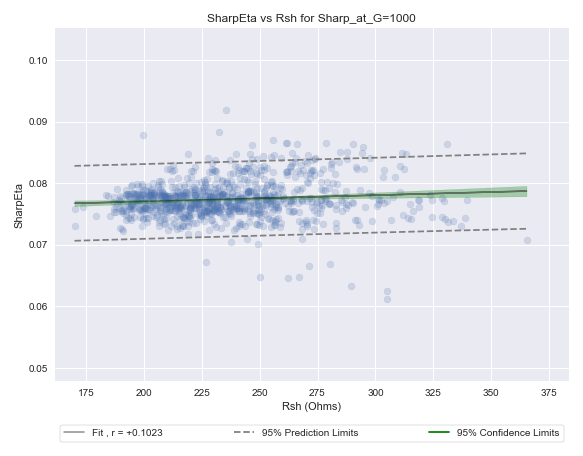

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta
p is [-0.02818244  0.12684446]
cov is [[ 1.28301141e-05 -1.57066020e-05]
 [-1.57066020e-05  1.92459560e-05]]
Final covariance is -3.945674983235133e-05. Then correlation is -0.25716736218566033


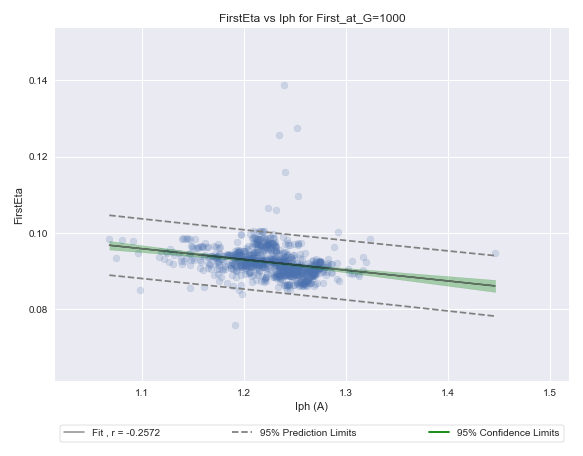

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta
p is [-0.00928659  0.16333288]
cov is [[ 9.63505843e-07 -4.90871149e-06]
 [-4.90871149e-06  2.50545196e-05]]
Final covariance is -0.0004474274966897491. Then correlation is -0.30878984853028496


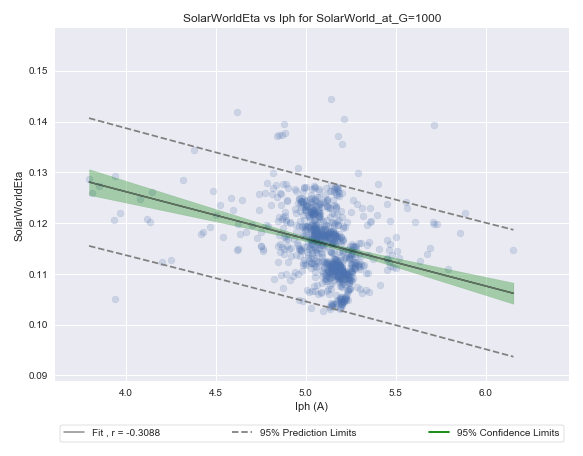

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta
p is [-0.00048866  0.10306693]
cov is [[ 8.79240566e-06 -2.11007448e-05]
 [-2.11007448e-05  5.07217059e-05]]
Final covariance is -4.578854016893062e-06. Then correlation is -0.005372184239252347


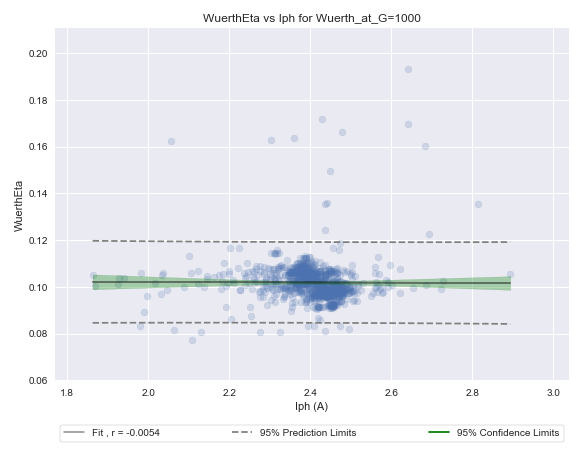

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta
p is [0.00011261 0.07715728]
cov is [[ 1.13226574e-06 -2.54397495e-06]
 [-2.54397495e-06  5.72614284e-06]]
Final covariance is 1.0283324073161427e-06. Then correlation is 0.003462912657140104


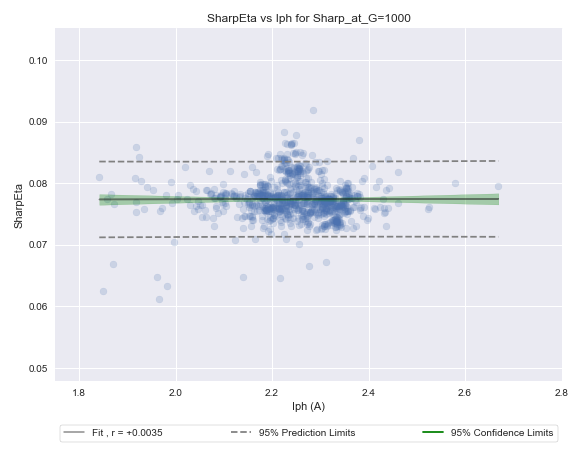

PortSwap - FirstEta matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstEta
p is [0.00815788 0.07232276]
cov is [[ 7.65966865e-07 -1.87981084e-06]
 [-1.87981084e-06  4.63086512e-06]]
Final covariance is 0.00018632754788195472. Then correlation is 0.3006721773599609


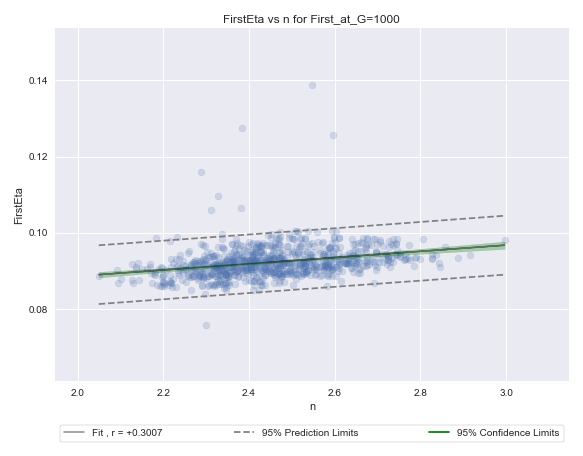

PortSwap - SolarWorldEta matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldEta
p is [0.03801535 0.05864783]
cov is [[ 1.36381190e-05 -2.05828206e-05]
 [-2.05828206e-05  3.11094714e-05]]
Final covariance is 0.00012716255274554083. Then correlation is 0.3330677595877581


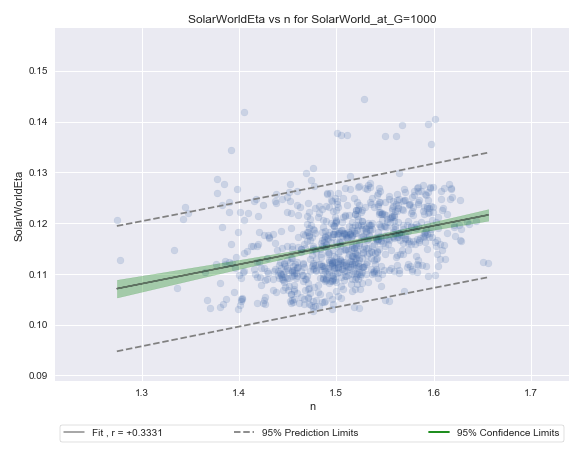

PortSwap - WuerthEta matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthEta
p is [0.00564519 0.09324548]
cov is [[ 5.34023890e-06 -8.18152800e-06]
 [-8.18152800e-06  1.26164023e-05]]
Final covariance is 8.654443466405187e-05. Then correlation is 0.07938329170969341


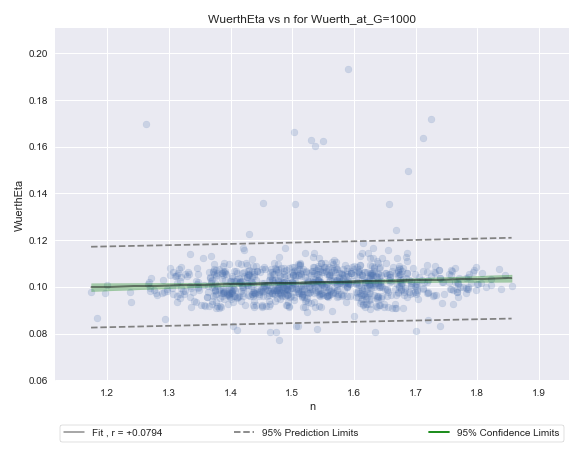

PortSwap - SharpEta matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpEta
p is [0.00426648 0.06947094]
cov is [[ 5.46229587e-07 -1.01646298e-06]
 [-1.01646298e-06  1.90148933e-06]]
Final covariance is 7.797105164115365e-05. Then correlation is 0.18560126549298908


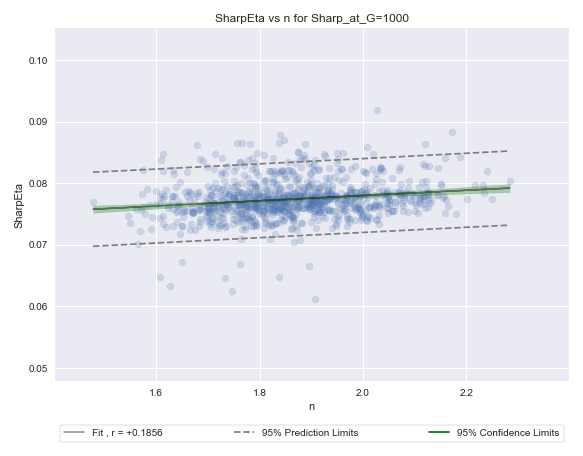

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF
p is [0.00246424 0.59886609]
cov is [[ 1.69042826e-07 -1.15415057e-06]
 [-1.15415057e-06  7.91661714e-06]]
Final covariance is 0.000533265998176241. Then correlation is 0.1986846700572447


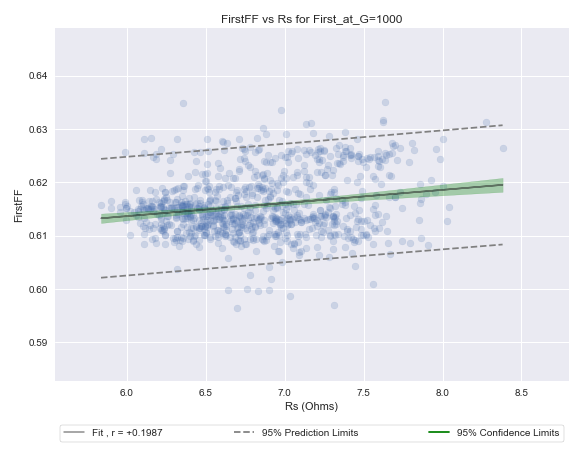

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF
p is [-0.06140876  0.71398414]
cov is [[ 1.60613279e-05 -2.91686950e-06]
 [-2.91686950e-06  6.73235909e-07]]
Final covariance is -0.0005486888048259492. Then correlation is -0.4653262126869637


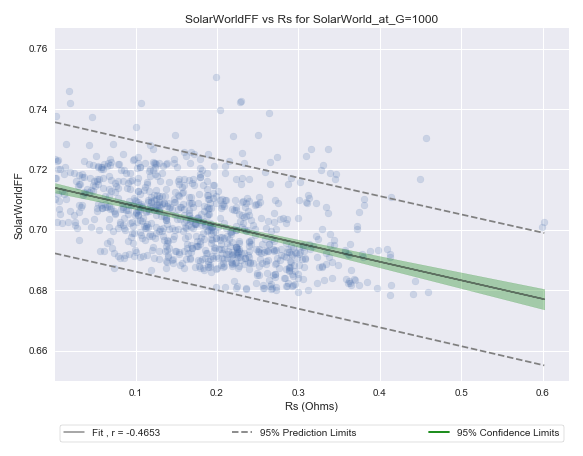

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF
p is [-0.00265303  0.68328357]
cov is [[ 1.15721795e-06 -8.45734334e-07]
 [-8.45734334e-07  7.85834141e-07]]
Final covariance is -0.0003845654477788876. Then correlation is -0.08013804261090388


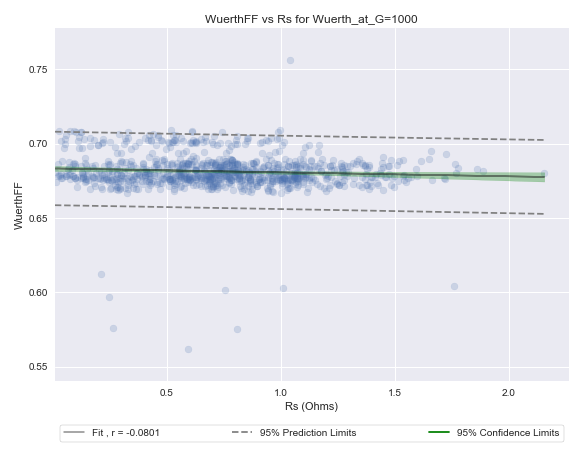

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF
p is [-0.00656323  0.63353335]
cov is [[ 3.13379638e-07 -7.76561258e-07]
 [-7.76561258e-07  1.99871273e-06]]
Final covariance is -0.001557722254673162. Then correlation is -0.3581264916273235


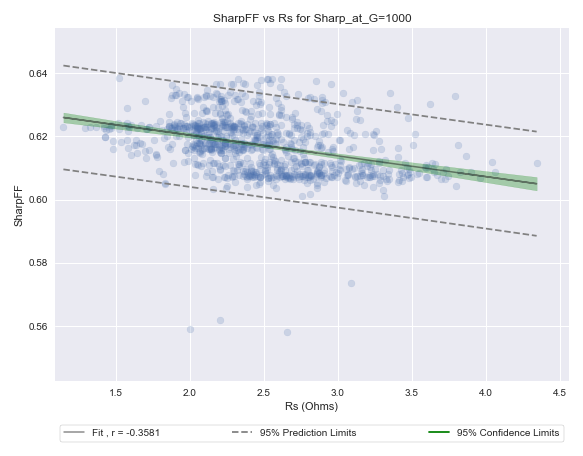

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF
p is [5.30941168e-06 6.08670102e-01]
cov is [[ 2.86332231e-13 -3.78623217e-10]
 [-3.78623217e-10  5.34885690e-07]]
Final covariance is 0.6346124824871201. Then correlation is 0.31814734271123746


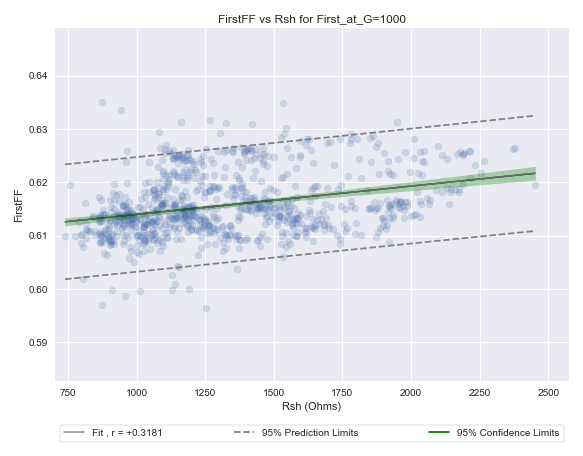

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF
p is [6.52722617e-05 6.65310193e-01]
cov is [[ 8.85657069e-12 -5.09117945e-09]
 [-5.09117945e-09  3.04355036e-06]]
Final covariance is 0.8615256301925548. Then correlation is 0.6011429297196555


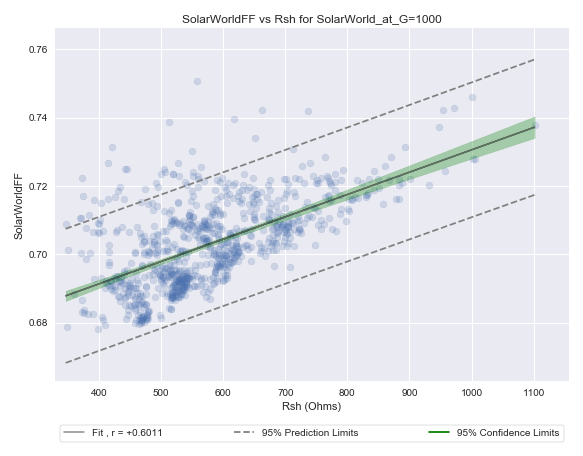

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF
p is [2.35306350e-04 6.32548258e-01]
cov is [[ 1.29391194e-10 -2.68323541e-08]
 [-2.68323541e-08  5.68030592e-06]]
Final covariance is 0.21091087375640613. Then correlation is 0.5589190991070322


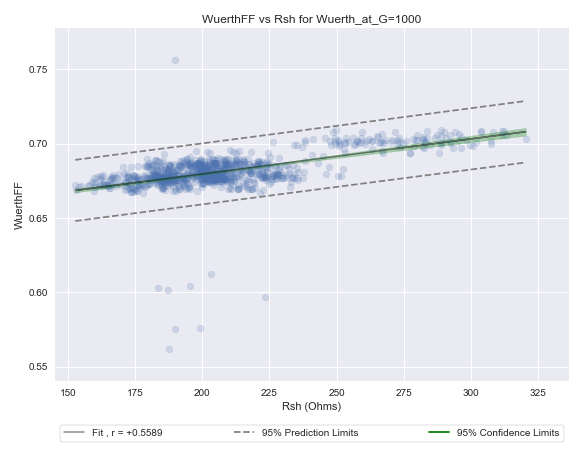

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF
p is [1.70356172e-04 5.77034788e-01]
cov is [[ 5.66841631e-11 -1.33876730e-08]
 [-1.33876730e-08  3.21698880e-06]]
Final covariance is 0.16555443791893054. Then correlation is 0.5948151162378927


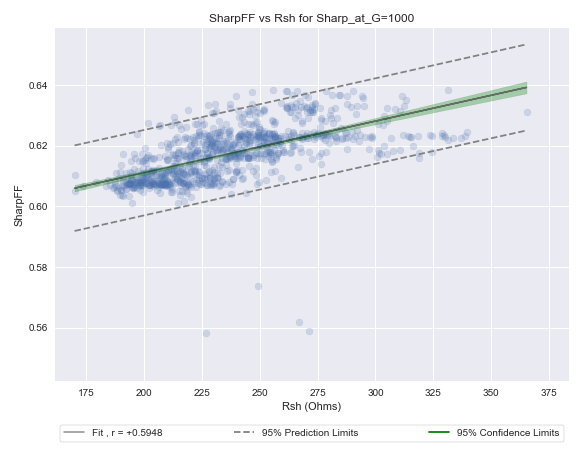

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF
p is [-0.03160569  0.65438248]
cov is [[ 2.60593447e-05 -3.19018017e-05]
 [-3.19018017e-05  3.90906111e-05]]
Final covariance is -4.424946991224384e-05. Then correlation is -0.20496867003806263


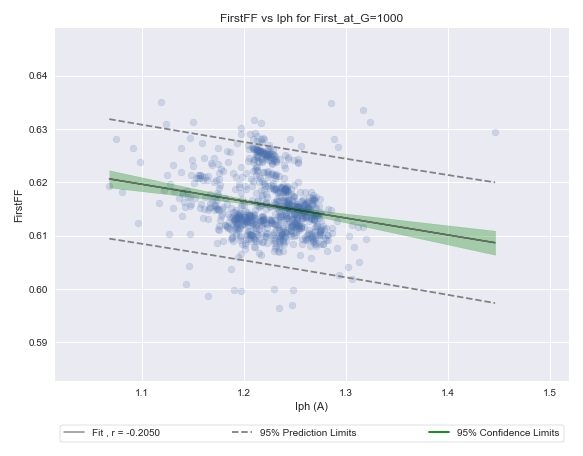

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF
p is [-0.03035896  0.85749966]
cov is [[ 2.71610809e-06 -1.38375819e-05]
 [-1.38375819e-05  7.06283037e-05]]
Final covariance is -0.0014626929224210168. Then correlation is -0.5341944128071272


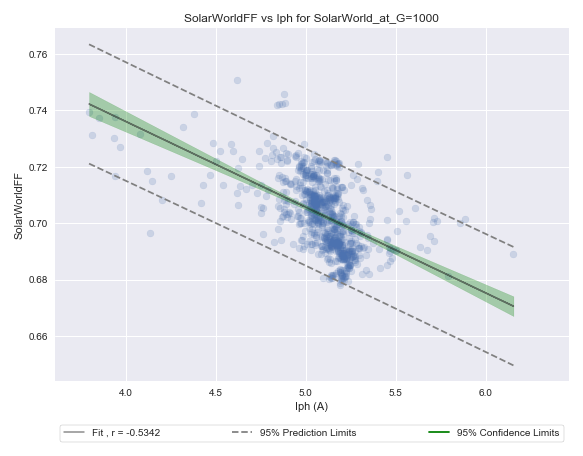

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF
p is [-0.02404081  0.73903979]
cov is [[ 1.74020283e-05 -4.17628319e-05]
 [-4.17628319e-05  1.00388972e-04]]
Final covariance is -0.00022526893800822934. Then correlation is -0.18463237892350848


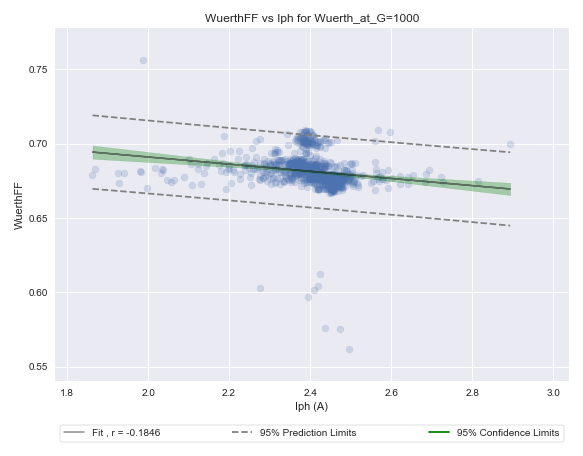

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF
p is [0.02396916 0.56341561]
cov is [[ 8.73002504e-06 -1.96146224e-05]
 [-1.96146224e-05  4.41498568e-05]]
Final covariance is 0.0002188748486868513. Then correlation is 0.2565411322868693


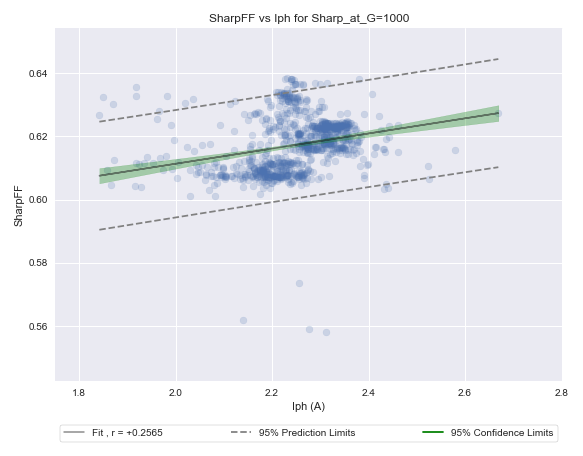

PortSwap - FirstFF matches ['FirstPMPP', 'FirstEta', 'FirstFF'] 	 panel is First
PortSwap - FirstFF
p is [0.00209258 0.61055531]
cov is [[ 1.66257231e-06 -4.08023062e-06]
 [-4.08023062e-06  1.00515420e-05]]
Final covariance is 4.779487282707688e-05. Then correlation is 0.05481284612850956


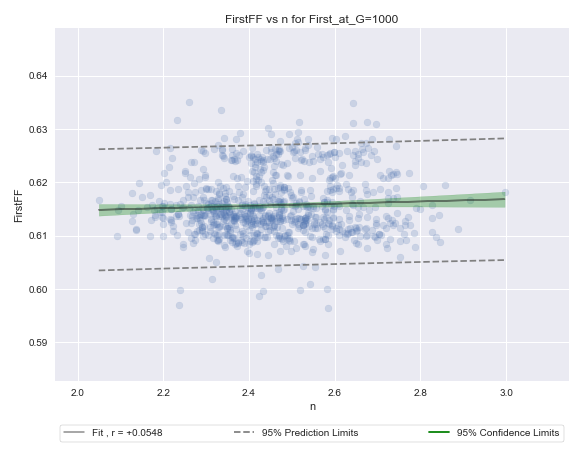

PortSwap - SolarWorldFF matches ['SolarWorldPMPP', 'SolarWorldEta', 'SolarWorldFF'] 	 panel is SolarWorld
PortSwap - SolarWorldFF
p is [0.04690247 0.63204601]
cov is [[ 5.21972205e-05 -7.87767010e-05]
 [-7.87767010e-05  1.19065388e-04]]
Final covariance is 0.0001568902517307958. Then correlation is 0.21745788264422614


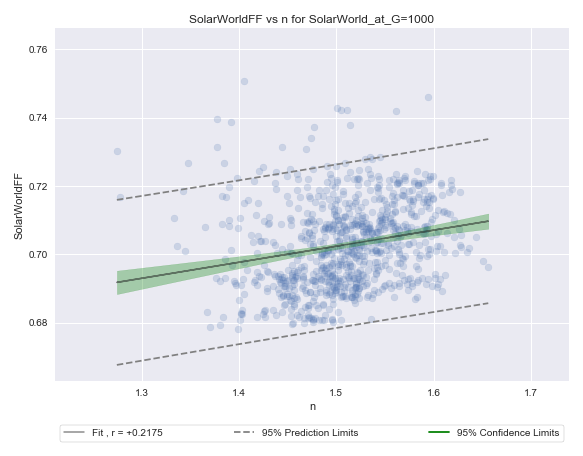

PortSwap - WuerthFF matches ['WuerthPMPP', 'WuerthEta', 'WuerthFF'] 	 panel is Wuerth
PortSwap - WuerthFF
p is [1.07426819e-05 6.81328191e-01]
cov is [[ 1.10125294e-05 -1.68717766e-05]
 [-1.68717766e-05  2.60172819e-05]]
Final covariance is 1.6469225499144028e-07. Then correlation is 0.00010552991469681028


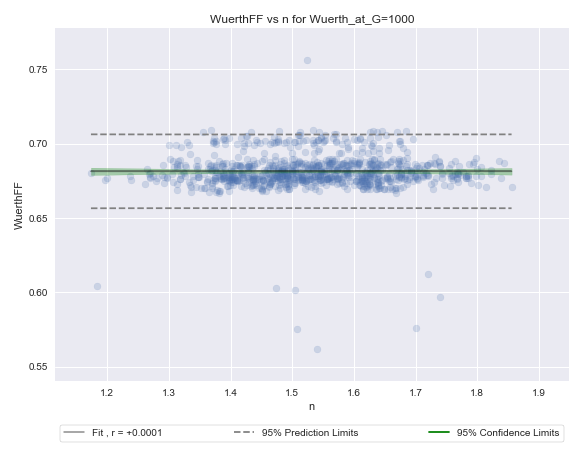

PortSwap - SharpFF matches ['SharpPMPP', 'SharpEta', 'SharpFF'] 	 panel is Sharp
PortSwap - SharpFF
p is [-0.01492741  0.64504752]
cov is [[ 4.43101665e-06 -8.24555188e-06]
 [-8.24555188e-06  1.54248892e-05]]
Final covariance is -0.0002728025609401452. Then correlation is -0.2260211692959368


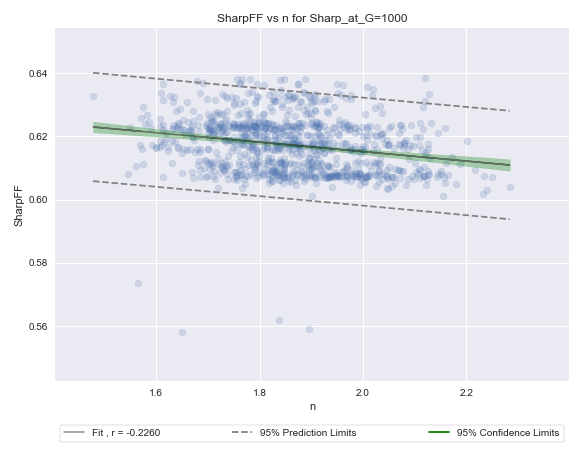

In [16]:
elec_chars = [
    ['Rs','Ohms']
    ,['Rsh','Ohms']
    ,['Iph','A']
    ,['n','']
]
temps = [
    ['TMod','C']
    ,['Tamb','C']
    ,['PMPP','W']
    ,['Eta','']
    ,['FF','']
]

swap_list = [
    ['PMPP','W']
    ,['Eta','']
    ,['FF','']
]
panel_specific_cols = [
    'TMod', 'PMPP','Eta', 'FF'
]
#df = panel[G_1000]
#    df_name = '{panel}_at_{irr}'.format(panel=panel_names_arr[panel_i],irr=irr_names_arr[G_1000])
check_irrs = [
    #G_500
    #,G_750
    G_1000
]
check_panels = [
    First
    ,SolarWorld
    ,Wurth 
    ,Sharp
]
need_lim = False
for temp in temps:    
    for elec_char in elec_chars:
        
        for panel_i, panel in enumerate(panel_arr) :
            if panel_i in check_panels:
                df = panel[G_1000]
                df_name = '{panel}_at_{irr}'.format(panel=panel_names_arr[panel_i],irr=irr_names_arr[G_1000])

                #plt.subplots(constrained_layout=True)
                
                for specific_col in panel_specific_cols:
                    if specific_col in temp[0]:
                        temp[0] = panel_names_arr[panel_i]+specific_col
                
                #This is inefficient
                swap_port = []
                for char_i,swap_char in enumerate(swap_list): 
                    #print([panel_names_arr[panel_i]+specific_col for specific_col in panel_specific_cols])
                    #print(swap_char[0])
                    if panel_names_arr[panel_i]+swap_char[0] in [panel_names_arr[panel_i]+specific_col for specific_col in panel_specific_cols]:
                        swap_port.append(panel_names_arr[panel_i]+swap_list[char_i][0])
                        #print('{} matches {}. Panel: {}. swap_port {}'.format(panel_specific_cols,swap_char[0], panel_names_arr[panel_i], swap_port ))
                    
                if elec_char[0] == 'I0':
                    need_lim = True
                else:
                      need_lim = False
                
                #print("BeforePortSwap - {} might matches {} \t panel is {}".format(temp[0],swap_port, panel_names_arr[panel_i]))
                if temp[0] in swap_port:
                    print("PortSwap - {} matches {} \t panel is {}".format(temp[0],swap_port, panel_names_arr[panel_i]))
                    # Swap Axis
                    print("PortSwap - "+temp[0])
                    plot_corr(
                            df
                            ,df_name
                            ,y_param=temp[0]
                            ,x_param=elec_char[0]
                            ,y_units=temp[1]
                            ,x_units=elec_char[1]
                            ,need_lim=need_lim
                        )
                else:
                    plot_corr(
                        df
                        ,df_name
                        ,x_param=temp[0]
                        ,y_param=elec_char[0]
                        ,y_units=elec_char[1]
                        ,x_units=temp[1]
                        ,need_lim=need_lim
                    )

In [17]:
#for panel_i, panel in enumerate(panel_arr) :
#    for irr_i, irr in enumerate(panel) :
#        panel_arr[panel_i][irr_i]['Year'] = panel_arr[panel_i][irr_i]['Year'].round().astype(int)
#        panel_arr[panel_i][irr_i]['Month'] = panel_arr[panel_i][irr_i]['Month'].round().astype(int)

In [18]:
#SolarWorldTMod and Rs for SolarWorld_at_G=1000
#plt.scatterplot([],panel_arr[SolarWorld][G_1000][])

#scatter_label(panel_arr[SolarWorld][G_1000],y_param='SolarWorldTMod',x_param='Rs',get_x_lim=False)

In [20]:
# Ideally, we'd define a class containing information about all the possible characteristics, what its units and rules should be. 
elec_chars = [
    ['Rs','Ohms']
    ,['Rsh','Ohms']
    ,['I0','A']
    ,['Iph','A']
    ,['n','']
]
temps = [
    ['TMod','C']
    ,['Tamb','C']
    ,['PMPP','W']
    ,['Eta','']
    ,['FF','']
]
table_cols = temps +elec_chars
print(table_cols)
panel_specific_cols = [
    'TMod', 'PMPP','Eta', 'FF'
]

check_irrs = [
    #G_500
    #,G_750
    G_1000
]
check_panels = [
    First
    ,SolarWorld
    ,Wurth 
    ,Sharp
]
print([item[0] for item in table_cols])
need_lim = False
i=0
avg_df = pd.DataFrame(columns=['Panel','Irradiance','Year','Month', 'NumDaysinMonth']+[item[0] for item in table_cols])
for panel_i, panel in enumerate(panel_arr) :
    if panel_i in check_panels:
        for irr_i, irr in enumerate(panel) :
            if irr_i in check_irrs:
                minYear = irr['Year'].min()
                maxYear = irr['Year'].max()
                print('minYear {}\tmaxYear {}'.format(minYear, maxYear))
                
                for year in range(minYear,maxYear+1):
                    minMonth = irr['Month'][irr['Year']==year].min()
                    maxMonth = irr['Month'][irr['Year']==year].max()
                    for month in range(minMonth,maxMonth+1):
                        numDays = len((np.unique(irr['Day'][(irr['Year']==year) & (irr['Month']==month)])))
                        print('NumDays is {}'.format(numDays))
                        filt_irr = irr[(irr['Year']==year) & (irr['Month']==month)]
                        #print(filt_irr.columns)
                        #print('Year: {}\tMonth: {}\tNumDays: {}'.format(year, month, numDays))
                        month_avg_list = [
                            panel_names_arr[panel_i],
                            irr_names_arr[irr_i],
                            year,
                            month,
                            numDays
                        ]
                        #print(month_avg_list)
                        for table_col in table_cols:    
                            for specific_col in panel_specific_cols:
                                if specific_col in table_col[0]:
                                    table_col[0] = panel_names_arr[panel_i]+specific_col
                            
                            #print('{}'.format([panel_names_arr[panel_i],irr_names_arr[irr_i],table_col[0]]))
                            month_avg_list.append(filt_irr[table_col[0]].mean())
                        print(month_avg_list)
                        avg_df.loc[i]=month_avg_list
                        i=i+1
        print(avg_df.dropna(inplace=True))
avg_df.to_excel("all_panel_average_monthly_g1000.xlsx")
                        
                        
                    #print(pd.Series(month_avg_list))
                    #print(pd.DataFrame(list(month_avg_list.items())))
                    #(filtered_df_arr_first[irr_i]['Voltage'], rows_compare=len(filtered_df_arr_first[irr_i]['Voltage']))) 
                    #print(len(irr[table_col[0]]))
                    #print(irr[table_col[0]][0])
                    #print('MonthRange: {}'.format(np.unique(irr['Month'])))
                    #.apply(pd.to_numeric, errors='coerce')
                    #minYear = irr['Year'].min()
                    #maxYear = irr['Year'].max()
                    #print('minYear {}\tmaxYear {}'.format(minYear, maxYear))
                    #for year in range(minYear,maxYear+1):
                    #    minMonth = irr['Month'][irr['Year']==year].min()
                    #    maxMonth = irr['Month'][irr['Year']==year].max()
                    #    for month in range(minMonth,maxMonth+1):
                    #        numDays = len(np.unique(irr['Day'][(irr['Year']==year) & (irr['Month']==month)]))
                    #        print('Year: {}\tMonth: {}\tNumDays: {}'.format(year, month, numDays))
                    #        
                    #        
                            
                    #print('MinYear: {}\tMinMonthofthatYear: {}, NumDaysinthatMonth: {}'.format(minYear
                    #                                                    , irr['Month'][irr['Year']==minYear].min()
                    #                                                    , len(irr['Day'][(irr['Year']==minYear) & (irr['Month']==irr['Month'][irr['Year']==minYear].min())])))
                    #for year in np.unique(irr['Year']):
                    #    for month in np.unique(irr['Month']):
                    #        print('len:'+str(len(irr[table_col[0]][(irr['Year'] == year) & (irr['Month'] == month)])))
                    #        print(irr[table_col[0]][(irr['Year'] == year) & (irr['Month'] == month)].mean())
                    
                    #irr[(irr['Year'] == 2009) & (irr['Month'] == 9)]
                    

[['TMod', 'C'], ['Tamb', 'C'], ['PMPP', 'W'], ['Eta', ''], ['FF', ''], ['Rs', 'Ohms'], ['Rsh', 'Ohms'], ['I0', 'A'], ['Iph', 'A'], ['n', '']]
['TMod', 'Tamb', 'PMPP', 'Eta', 'FF', 'Rs', 'Rsh', 'I0', 'Iph', 'n']
minYear 2009	maxYear 2010
NumDays is 1
['First', 'G=1000', 2009, 8, 1, 38.490625, 20.0, 67.0575, 0.09950861362500003, 0.6266655780625001, 6.444976347246923, 1688.4378437158455, 1.6126453437899635e-05, 1.218998211052617, 2.5068433778258594]
NumDays is 17
['First', 'G=1000', 2009, 9, 17, 41.810990099009906, 17.86336633663366, 66.25930693069309, 0.09635306689108912, 0.6254908750099009, 7.270711416835861, 1513.3004042646583, 1.7562681280809266e-05, 1.220702813572812, 2.488162919258493]
NumDays is 12
['First', 'G=1000', 2010, 3, 12, 35.824444444444445, 13.634444444444444, 63.933657777777775, 0.09393629999999997, 0.6152458333333334, 7.0738828568987655, 1167.537746956913, 1.4594671816118001e-05, 1.1872755323638113, 2.4943367294001795]
NumDays is 19
['First', 'G=1000', 2010, 4, 19, 37.8

In [ ]:
print(panel_arr[SolarWorld][G_1000][[item[0] for item in table_cols]][(panel_arr[SolarWorld][G_1000]['Year']==2010) & (panel_arr[SolarWorld][G_1000]['Month']==1)])

In [ ]:
print(avg_df)

In [23]:
# Ideally, we'd define a class containing information about all the possible characteristics, what its units and rules should be. 
elec_chars = [
    #['Rs','Ohms']
    #,['Rsh','Ohms']
    #,['I0','A']
    #,['Iph','A']
    #,['n','']
]
#TODO; find our own values of ISC and UOC from the IV curves
temps = [
    ['ISC','A']
    ,['UOC','V']
    ,['PMPP','W']
    #,['Eta','']
    #,['FF','']
]
table_cols = temps +elec_chars
print(table_cols)
panel_specific_cols = [
    'TMod', 'PMPP','Eta', 'FF','ISC','UOC'
]

check_irrs = [
    G_500
    ,G_750
    ,G_1000
]
check_panels = [
    First
    ,SolarWorld
    ,Wurth 
    ,Sharp
]

check_months = [9] #september
print([item[0] for item in table_cols])
need_lim = False
i=0
avg_df = pd.DataFrame(columns=['Panel','Irradiance','Year','Month', 'NumDaysinMonth']+[item[0] for item in table_cols])
for panel_i, panel in enumerate(panel_arr) :
    if panel_i in check_panels:
        for irr_i, irr in enumerate(panel) :
            if irr_i in check_irrs:
                minYear = irr['Year'].min()
                maxYear = irr['Year'].max()
                print('minYear {}\tmaxYear {}'.format(minYear, maxYear))
                
                for year in range(minYear,maxYear+1):
                    minMonth = irr['Month'][irr['Year']==year].min()
                    maxMonth = irr['Month'][irr['Year']==year].max()
                    for month in range(minMonth,maxMonth+1):
                        if month in check_months:
                            numDays = len((np.unique(irr['Day'][(irr['Year']==year) & (irr['Month']==month)])))
                            print('NumDays is {}'.format(numDays))
                            filt_irr = irr[(irr['Year']==year) & (irr['Month']==month)]
                            #print(filt_irr.columns)
                            #print('Year: {}\tMonth: {}\tNumDays: {}'.format(year, month, numDays))
                            month_avg_list = [
                                panel_names_arr[panel_i],
                                irr_names_arr[irr_i],
                                year,
                                month,
                                numDays
                            ]
                            #print(month_avg_list)
                            for table_col in table_cols:    
                                for specific_col in panel_specific_cols:
                                    if specific_col in table_col[0]:
                                        table_col[0] = panel_names_arr[panel_i]+specific_col
                                
                                #print('{}'.format([panel_names_arr[panel_i],irr_names_arr[irr_i],table_col[0]]))
                                month_avg_list.append(filt_irr[table_col[0]].mean())
                            print(month_avg_list)
                            avg_df.loc[i]=month_avg_list
                            i=i+1
        print(avg_df.dropna(inplace=True))
avg_df.to_excel("all_panel_average_Septmonth_all_irr.xlsx")




[['ISC', 'A'], ['UOC', 'V'], ['PMPP', 'W']]
['ISC', 'UOC', 'PMPP']
minYear 2009	maxYear 2010
NumDays is 22
['First', 'G=500', 2009, 9, 22, 0.5927619047619052, 87.54552380952383, 34.69352380952381]
NumDays is 24
['First', 'G=500', 2010, 9, 24, 0.6041981981981981, 87.30252252252254, 34.538314414414394]
minYear 2009	maxYear 2010
NumDays is 22
['First', 'G=750', 2009, 9, 22, 0.9012149532710277, 87.58186915887849, 51.05214953271025]
NumDays is 16
['First', 'G=750', 2010, 9, 16, 0.9167472527472533, 86.8068131868132, 50.794647252747254]
minYear 2009	maxYear 2010
NumDays is 17
['First', 'G=1000', 2009, 9, 17, 1.2110891089108902, 87.4731683168317, 66.25930693069309]
NumDays is 10
['First', 'G=1000', 2010, 9, 10, 1.2268695652173913, 87.39202898550721, 66.40260579710142]
None
minYear 2009	maxYear 2010
NumDays is 21
['SolarWorld', 'G=500', 2009, 9, 21, 2.515222222222221, 42.381444444444455, 79.77711111111115]
NumDays is 23
['SolarWorld', 'G=500', 2010, 9, 23, 2.532410256410256, 42.68769230769231, 